Notebook presentation

To Do :
- re-compute msa embedding file with proper axis on the macro aggregs -> re do it again but with correct shape
- do something with channel 71 and 227/228
-

Notes :
- text

# Set Up

In [ ]:
#@title Imports

import numpy as np
import pandas as pd

# plots
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.manifold import TSNE

In [ ]:
#@title Paths and global vars
file_path = "first_compute_161_features_622_complexes.csv"

df = pd.read_csv(file_path)
df = df.rename(columns = {'Unnamed: 0': 'complex_id'})
df['is_positive'] = df['complex_id'].str.len() <= 8
df['is_positive'] = df['is_positive'].astype(int)

file_path = "all_msa_embedding_features_dict.npy"

msa_embeds = np.load(file_path, allow_pickle = True)[0]

# Functions

In [ ]:

#
def plot_scatter(X_embedded, Y, title = '', Y_name = 'label', palette = None):

  plot_data = pd.DataFrame(X_embedded, columns = ['TSNE_0', 'TSNE_1'])
  plot_data[Y_name] = Y

  sns.scatterplot(data = plot_data, x = 'TSNE_0', y = 'TSNE_1', hue = Y_name, alpha = 0.75, palette = palette)
  plt.title(title + '')
  plt.show()

  return


#
def run_msa_features_against_label(feature_list, complex_list, df, msa_embeds):

  for feature_name in feature_list:
    if type(msa_embeds['6iur_C-6iqj_A'][feature_name]) not in [list, type(np.array([1, 2]))]:
      continue
    feat_value_list = []
    label_list = []
    for complex_name in complex_list:
      label_list.append(df[df['complex_id'] == complex_name]['is_positive'].values[0])
      feat_value_list.append(msa_embeds[complex_name][feature_name])
    X = np.array(feat_value_list)
    print(feature_name, np.sum(np.isinf(X)))
    Y = np.array(label_list)
    X_embedded = TSNE(n_components = 2, perplexity=10).fit_transform(X)
    plot_scatter(X_embedded, Y, title = "MSA embeddings-derived feature vs. interaction label\n"+feature_name,
                 Y_name = "PepPI label", palette = None)
  #

  return


#
def run_msa_features_against_solo_feature(feature_list, complex_list, solo_feature_name, df, msa_embeds):

  for feature_name in feature_list:
    if type(msa_embeds['6iur_C-6iqj_A'][feature_name]) not in [list, type(np.array([1, 2]))]:
      continue
    feat_value_list = []
    label_list = []
    for complex_name in complex_list:
      label_list.append(df[df['complex_id'] == complex_name][solo_feature_name].values[0])
      feat_value_list.append(msa_embeds[complex_name][feature_name])
    X = np.array(feat_value_list)
    print(feature_name, np.sum(np.isinf(X)))
    Y = np.array(label_list)
    X_embedded = TSNE(n_components = 2, perplexity=10).fit_transform(X)
    plot_scatter(X_embedded, Y, title = "MSA embeddings-derived feature vs. task feature(legend)\n"+feature_name,
                 Y_name = solo_feature_name, palette = 'viridis_r')
  #

  return


#
# compare against success by just thresholding values with fixed values, no need to re run stuff, just do an inference function
def run_msa_features_against_success_rate(feature_list, complex_list, solo_feature_name, df, msa_embeds, feature_thresh = 0.75):

  for feature_name in feature_list:
    if type(msa_embeds['6iur_C-6iqj_A'][feature_name]) not in [list, type(np.array([1, 2]))]:
      continue
    feat_value_list = []
    label_list = []
    for complex_name in complex_list:
      temp_solo_feature_val = df[df['complex_id'] == complex_name][solo_feature_name].values[0]
      prediction = temp_solo_feature_val >= feature_thresh
      distance_to_thresh = temp_solo_feature_val - feature_thresh
      true_label = df[df['complex_id'] == complex_name]['is_positive'].values[0]
      if true_label:
        plot_label = 'TP' if prediction else 'FN'
      else:
        plot_label = 'FP' if prediction else 'TN'
      label_list.append(plot_label)
      feat_value_list.append(msa_embeds[complex_name][feature_name])
    X = np.array(feat_value_list)
    print(feature_name, np.sum(np.isinf(X)))
    Y = np.array(label_list)
    X_embedded = TSNE(n_components = 2, perplexity=10).fit_transform(X)
    plot_scatter(X_embedded, Y, title = "MSA embeddings-derived feature vs. success\n"+feature_name,
                 Y_name = "acc", palette = None)
  #

  return

# Main Run

In [ ]:
# one key per complex
complex_list = list(msa_embeds.keys())

# one key per vector feature
feature_list = list(msa_embeds['6iur_C-6iqj_A'].keys())

# each feature is (256,) shaped
for key in msa_embeds['6iur_C-6iqj_A'].keys():
  print(key)
  #print(msa_embeds['6iur_C-6iqj_A'][key])
#msa_embeds['6iur_C-6iqj_A']['rank_1_mean_all_aa'].shape

rank_1_mean_all_aa
median_ranks_mean_all_aa
mean_ranks_mean_all_aa
std_ranks_mean_all_aa
rank_1_mean_pep
median_ranks_mean_pep
mean_ranks_mean_pep
std_ranks_mean_pep
rank_1_mean_prot
median_ranks_mean_prot
mean_ranks_mean_prot
std_ranks_mean_prot
rank_1_std_all_aa
median_ranks_std_all_aa
mean_ranks_std_all_aa
std_ranks_std_all_aa
rank_1_std_pep
median_ranks_std_pep
mean_ranks_std_pep
std_ranks_std_pep
rank_1_std_prot
median_ranks_std_prot
mean_ranks_std_prot
std_ranks_std_prot
rank_1_min_all_aa
median_ranks_min_all_aa
mean_ranks_min_all_aa
std_ranks_min_all_aa
rank_1_min_pep
median_ranks_min_pep
mean_ranks_min_pep
std_ranks_min_pep
rank_1_min_prot
median_ranks_min_prot
mean_ranks_min_prot
std_ranks_min_prot
rank_1_max_all_aa
median_ranks_max_all_aa
mean_ranks_max_all_aa
std_ranks_max_all_aa
rank_1_max_pep
median_ranks_max_pep
mean_ranks_max_pep
std_ranks_max_pep
rank_1_max_prot
median_ranks_max_prot
mean_ranks_max_prot
std_ranks_max_prot
nb_ranks


rank_1_mean_all_aa 0


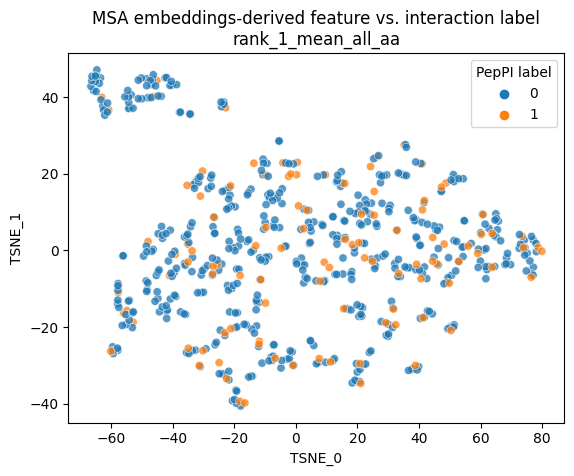

median_ranks_mean_all_aa 0


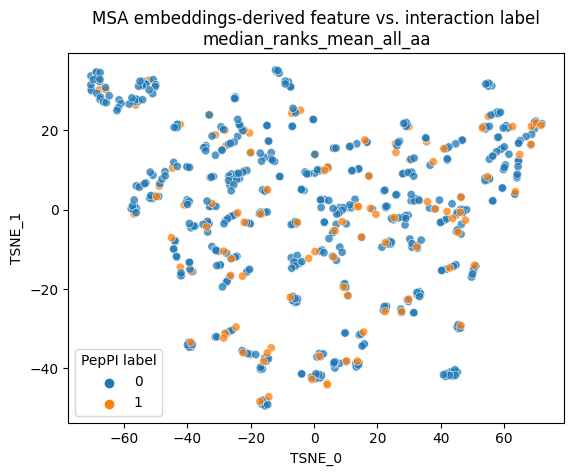

mean_ranks_mean_all_aa 0


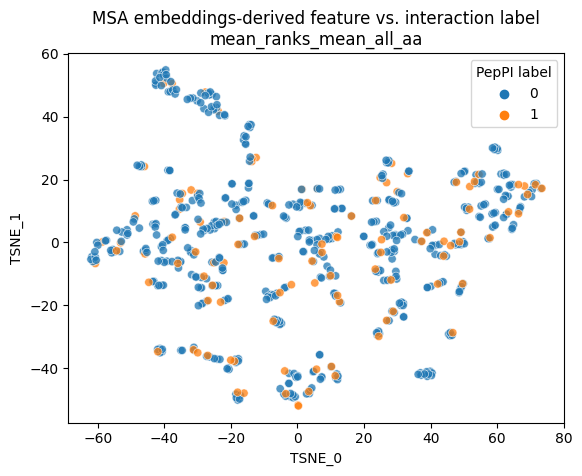

std_ranks_mean_all_aa 0


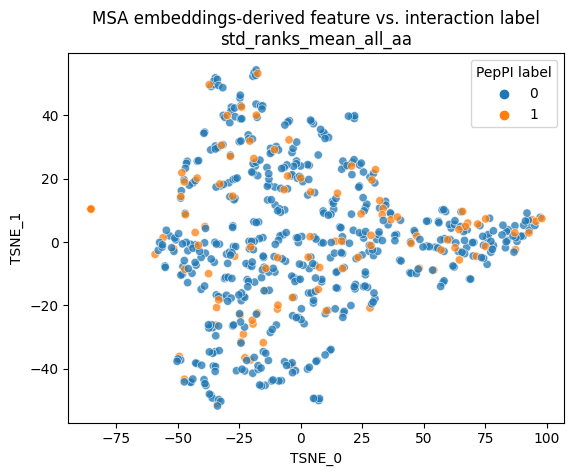

rank_1_mean_pep 0


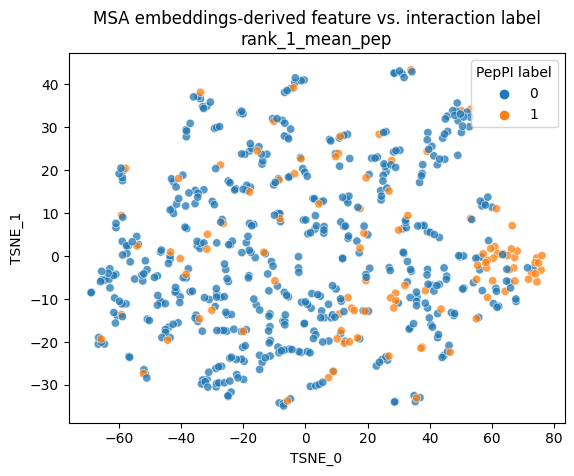

median_ranks_mean_pep 0


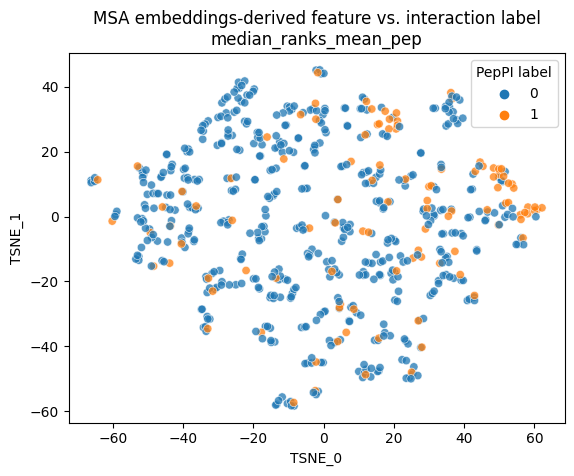

mean_ranks_mean_pep 0


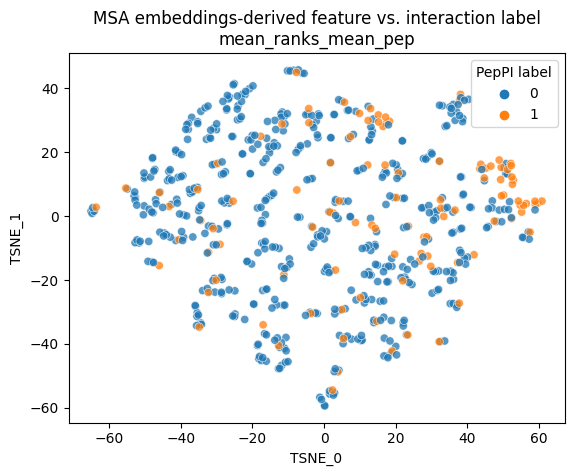

std_ranks_mean_pep 0


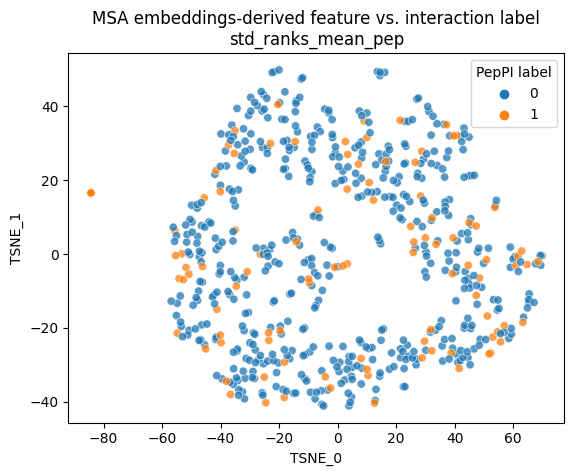

rank_1_mean_prot 0


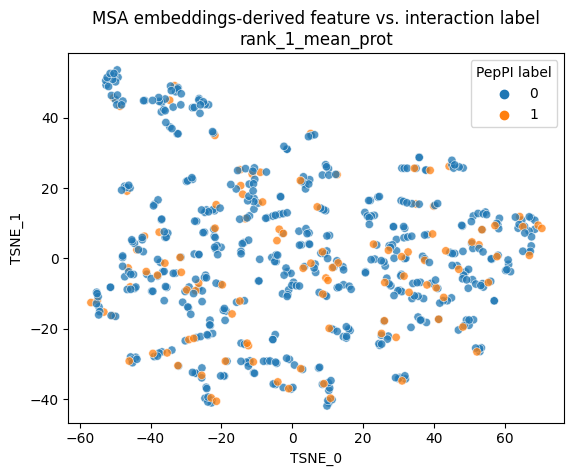

median_ranks_mean_prot 0


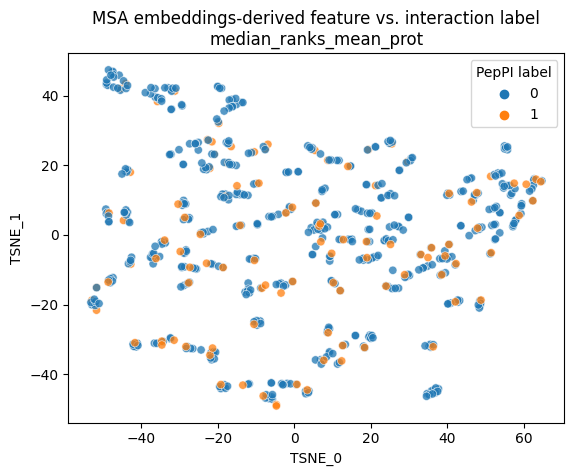

mean_ranks_mean_prot 0


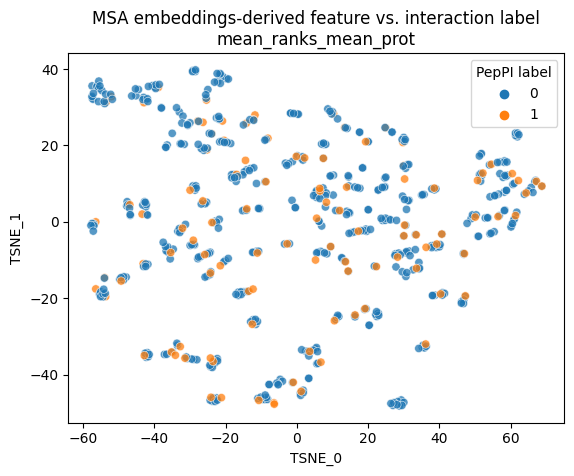

std_ranks_mean_prot 0


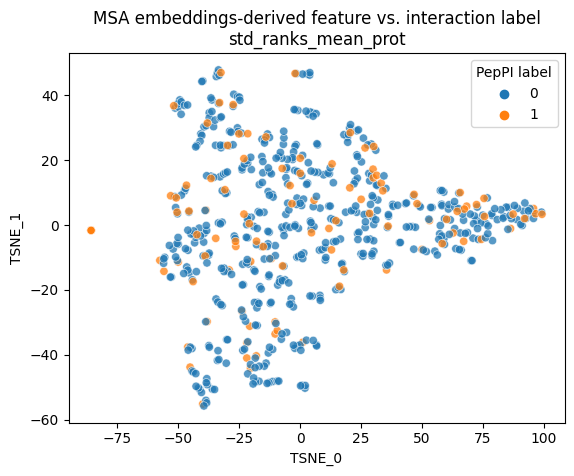

rank_1_std_all_aa 0


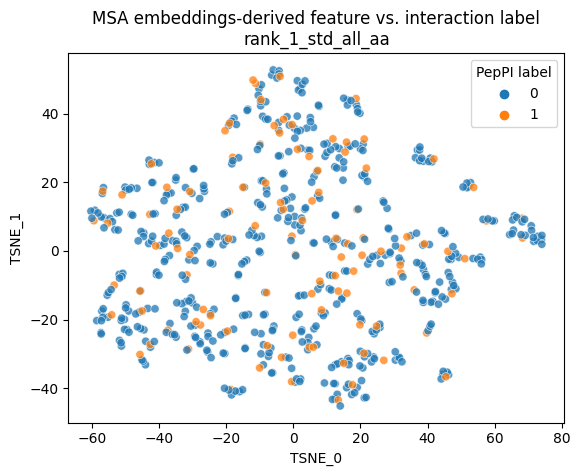

median_ranks_std_all_aa 0


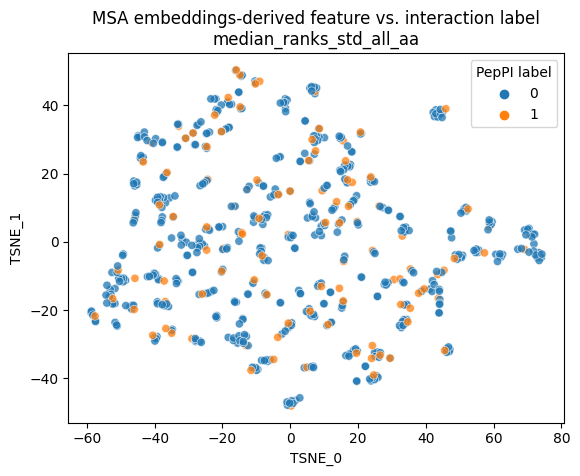

mean_ranks_std_all_aa 0


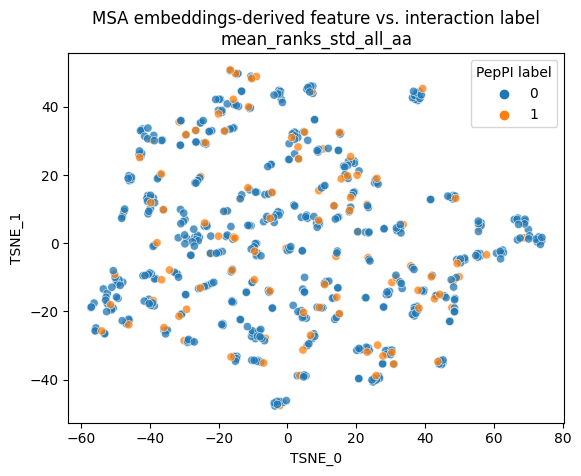

std_ranks_std_all_aa 0


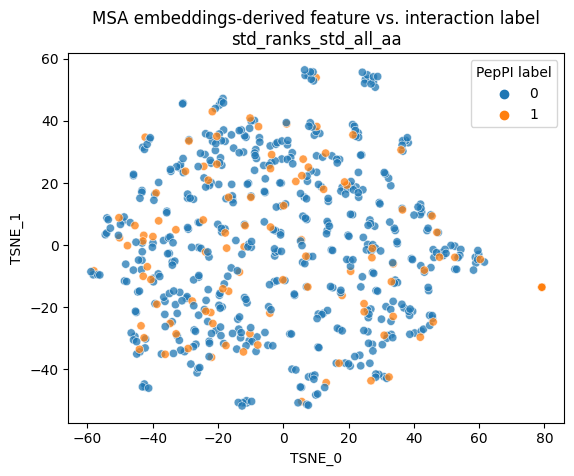

rank_1_std_pep 0


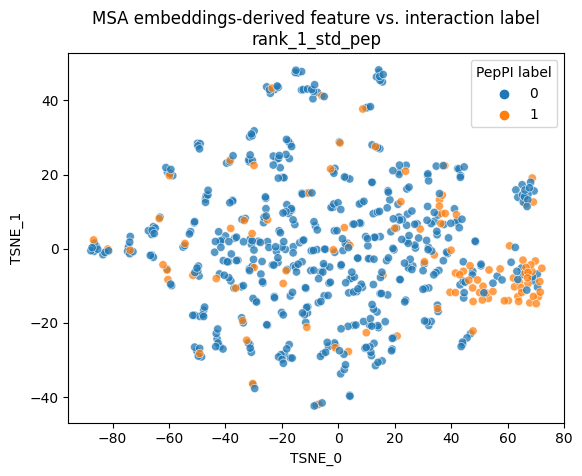

median_ranks_std_pep 0


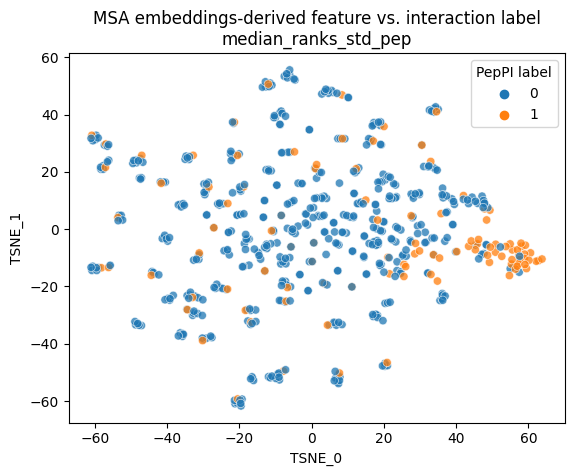

mean_ranks_std_pep 0


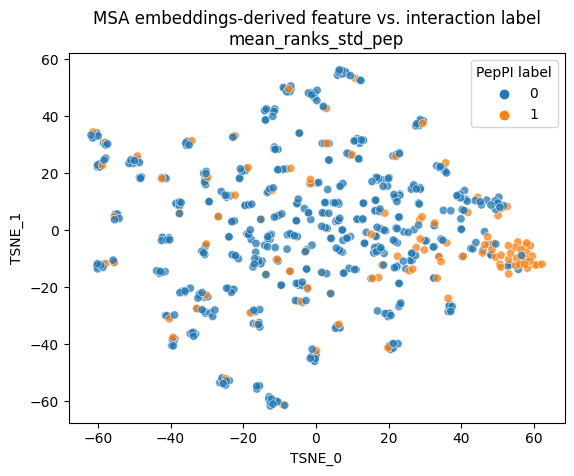

std_ranks_std_pep 0


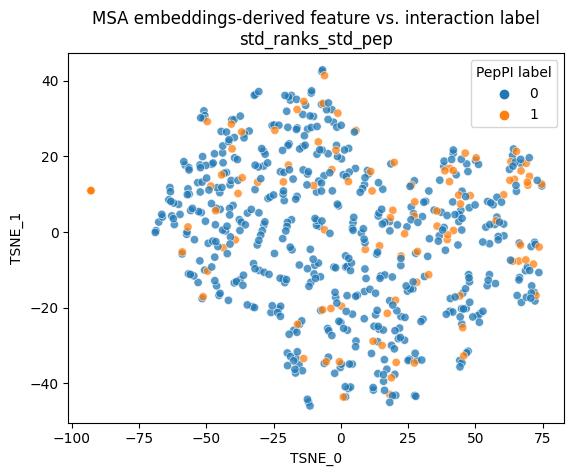

rank_1_std_prot 0


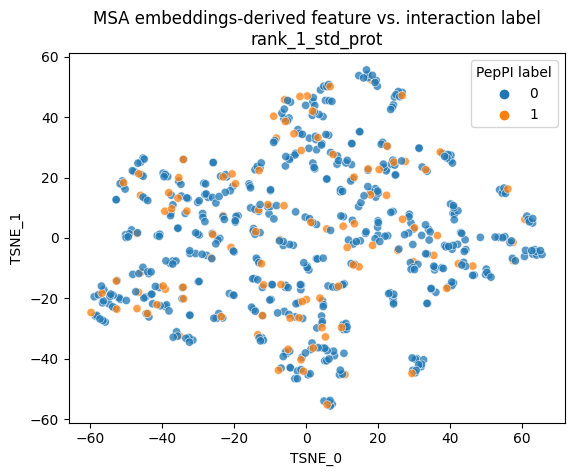

median_ranks_std_prot 0


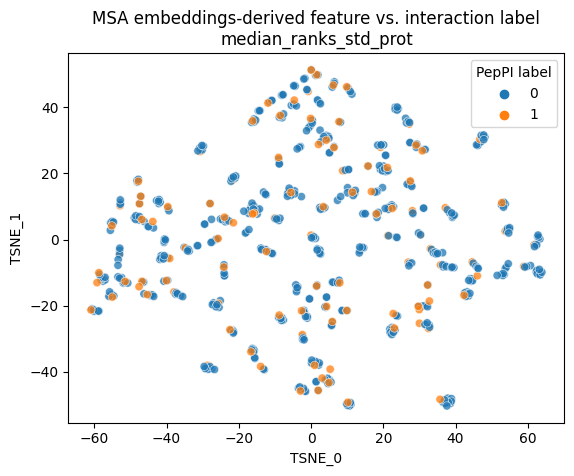

mean_ranks_std_prot 0


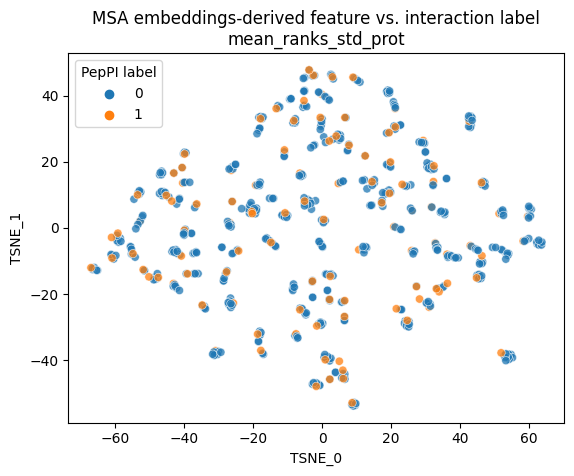

std_ranks_std_prot 0


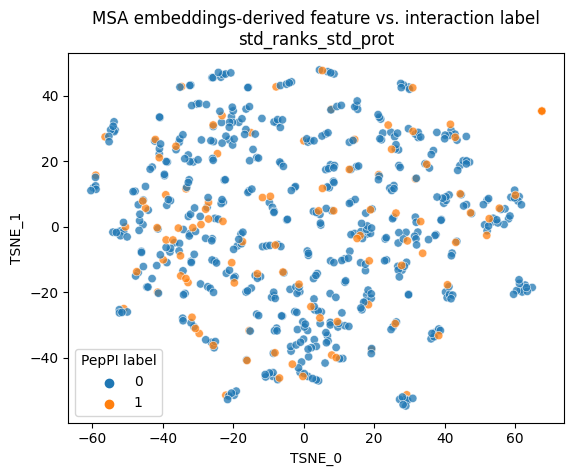

rank_1_min_all_aa 0


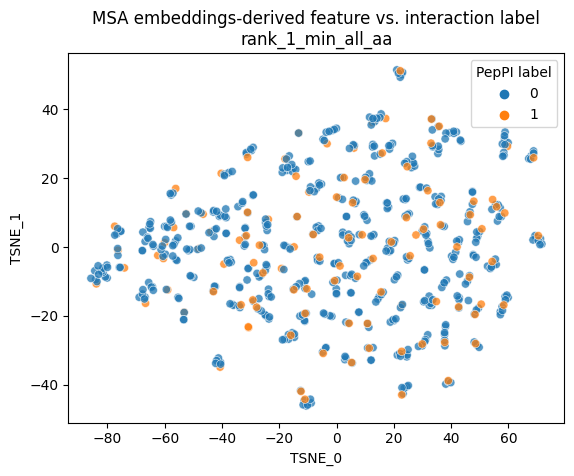

median_ranks_min_all_aa 0


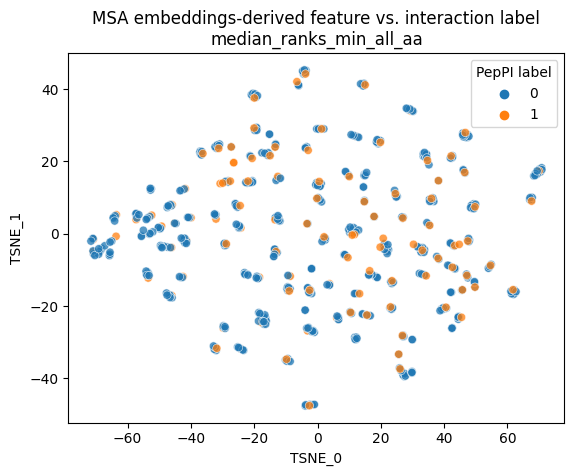

mean_ranks_min_all_aa 0


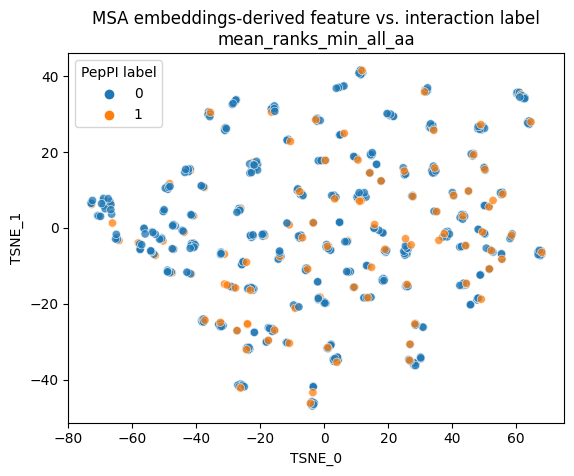

std_ranks_min_all_aa 0


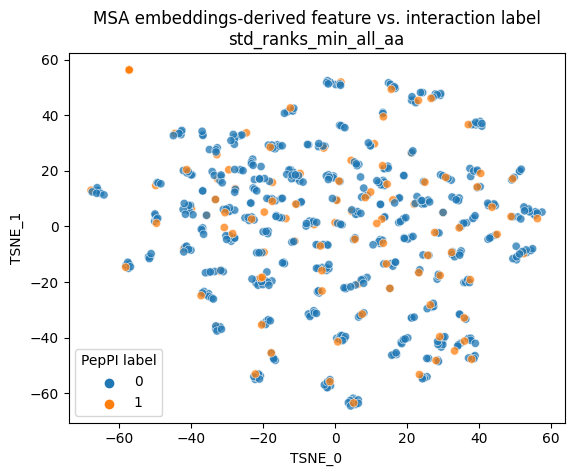

rank_1_min_pep 0


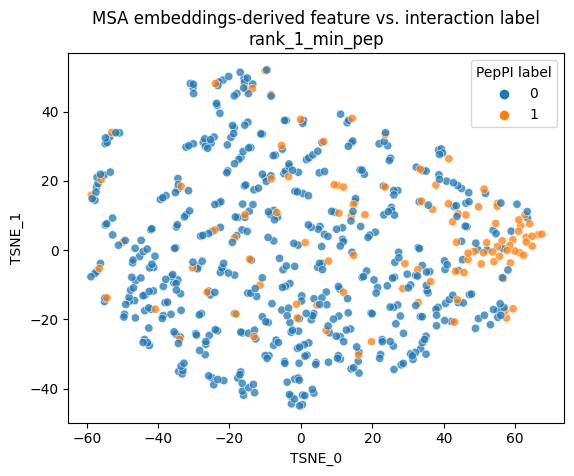

median_ranks_min_pep 0


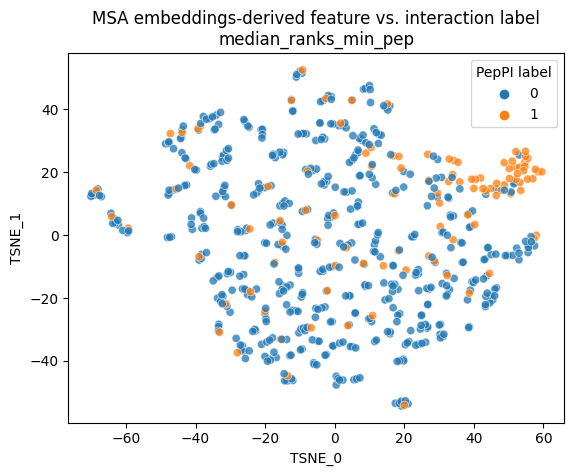

mean_ranks_min_pep 0


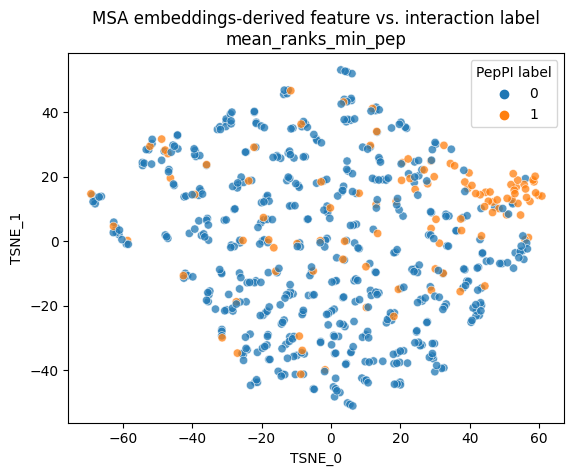

std_ranks_min_pep 0


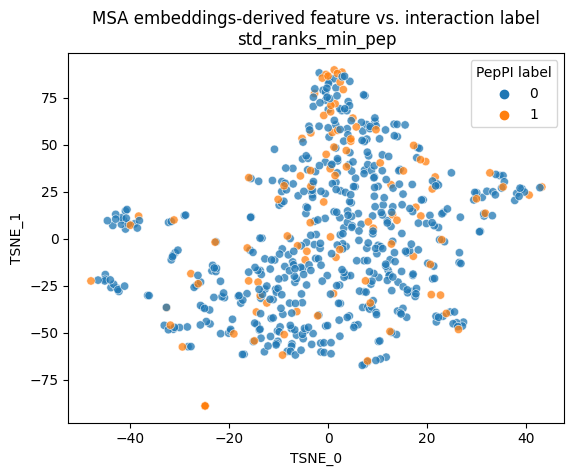

rank_1_min_prot 0


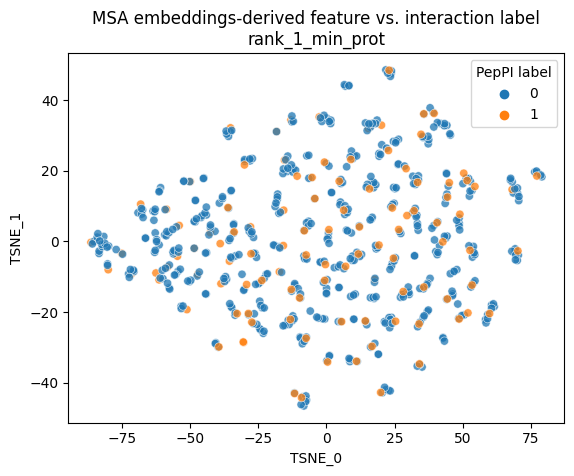

median_ranks_min_prot 0


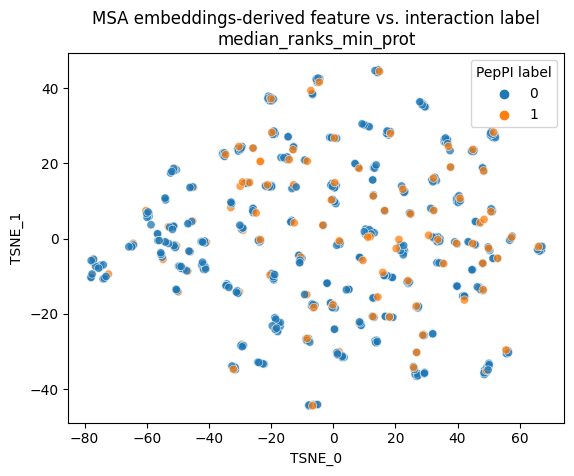

mean_ranks_min_prot 0


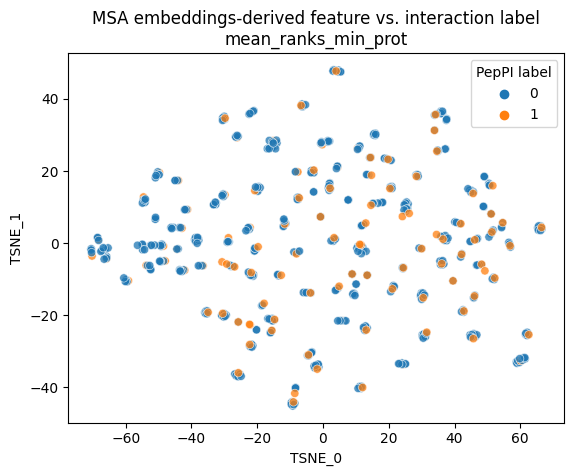

std_ranks_min_prot 0


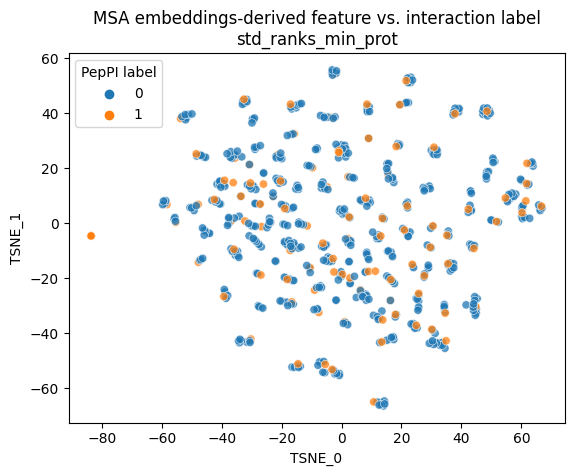

rank_1_max_all_aa 0


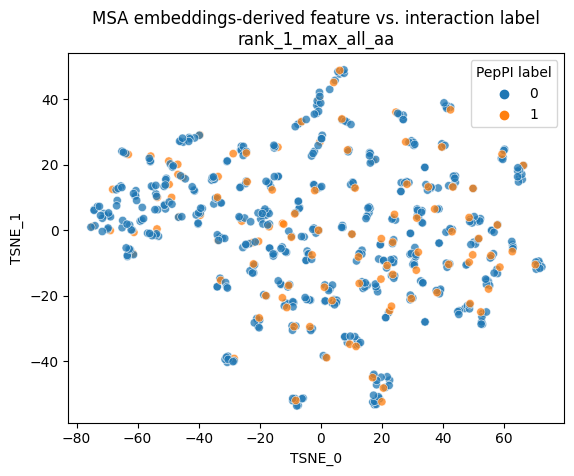

median_ranks_max_all_aa 0


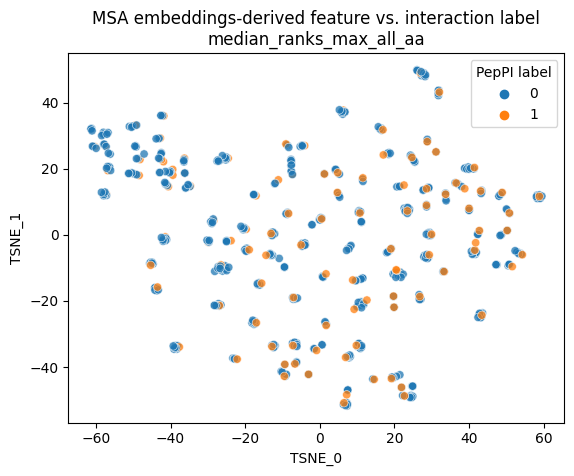

mean_ranks_max_all_aa 0


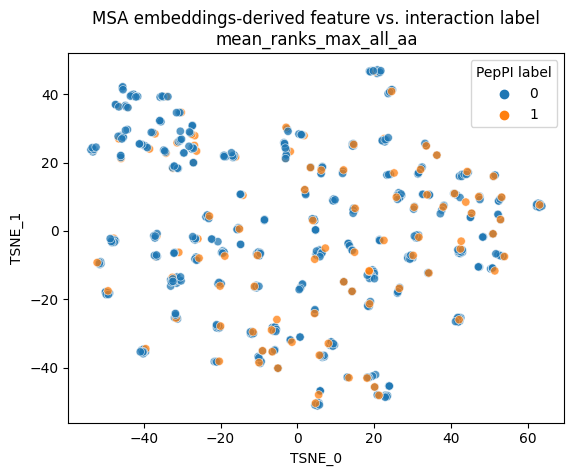

std_ranks_max_all_aa 0


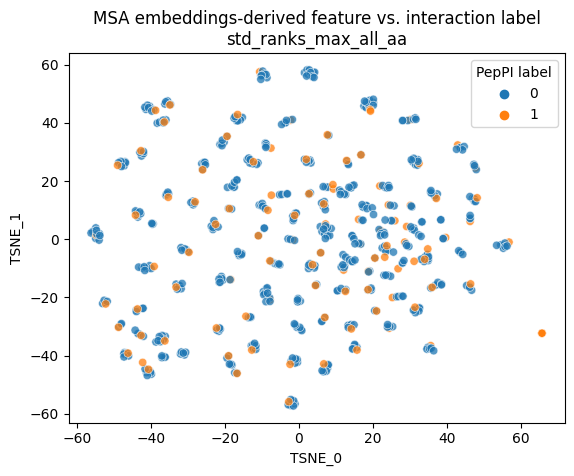

rank_1_max_pep 0


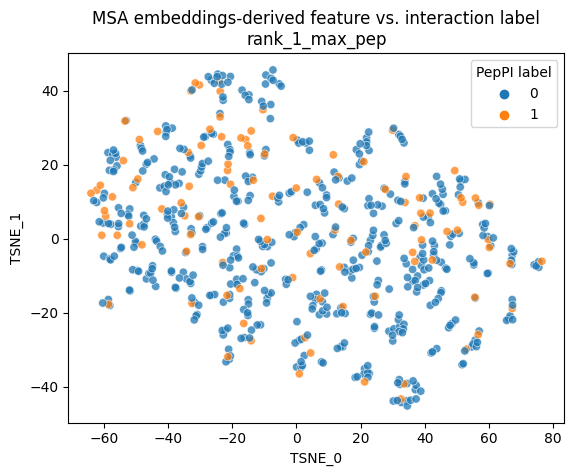

median_ranks_max_pep 0


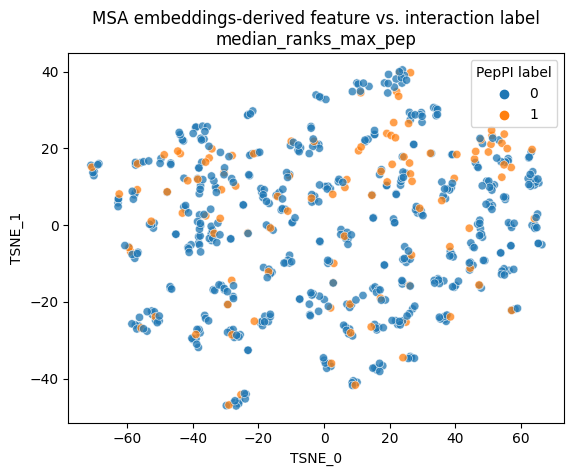

mean_ranks_max_pep 0


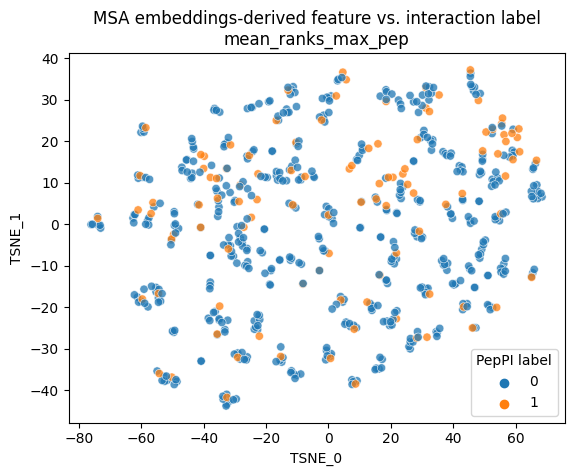

std_ranks_max_pep 0


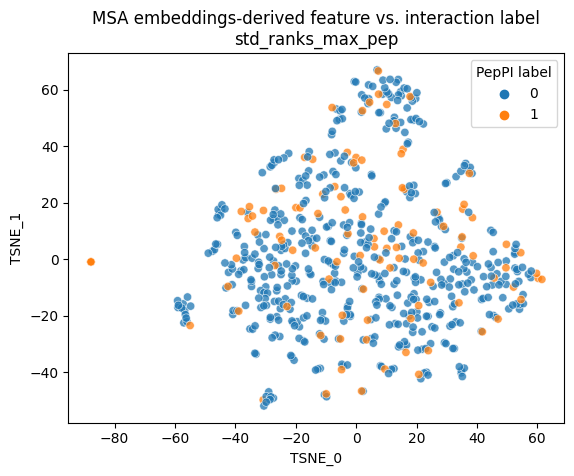

rank_1_max_prot 0


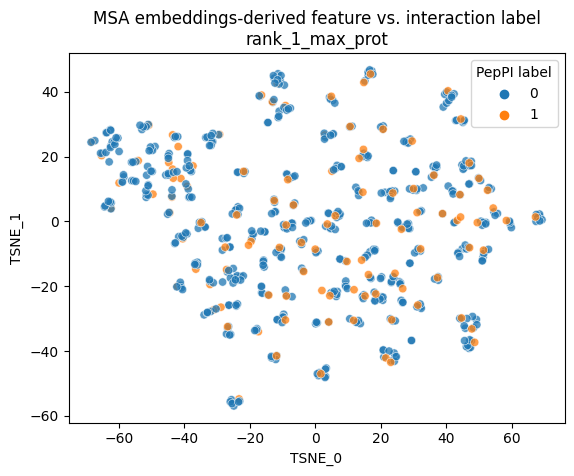

median_ranks_max_prot 0


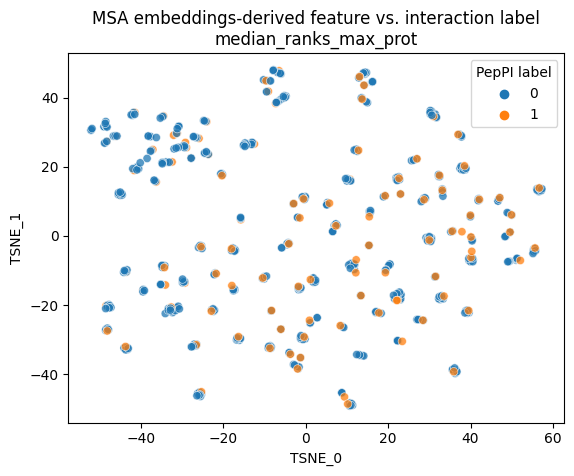

mean_ranks_max_prot 0


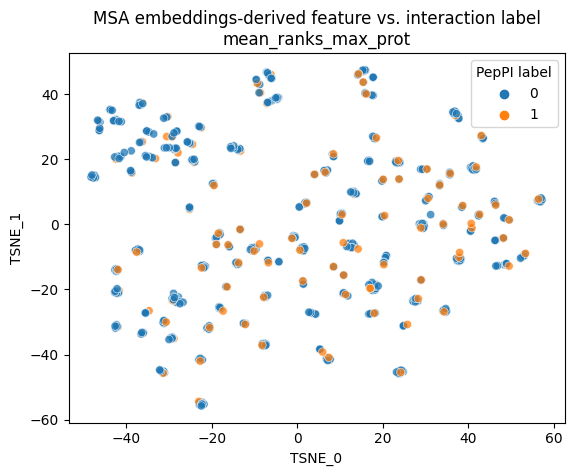

std_ranks_max_prot 0


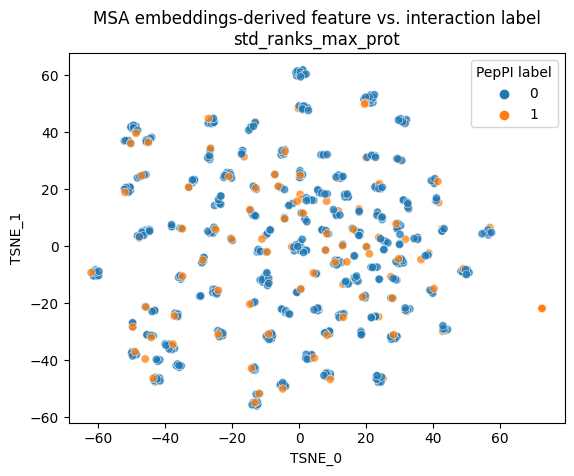

In [ ]:
run_msa_features_against_label(feature_list, complex_list,
                               df=df, msa_embeds=msa_embeds)

rank_1_mean_all_aa 0


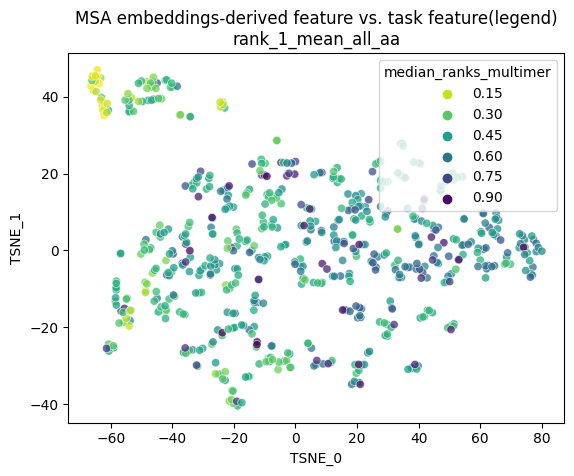

median_ranks_mean_all_aa 0


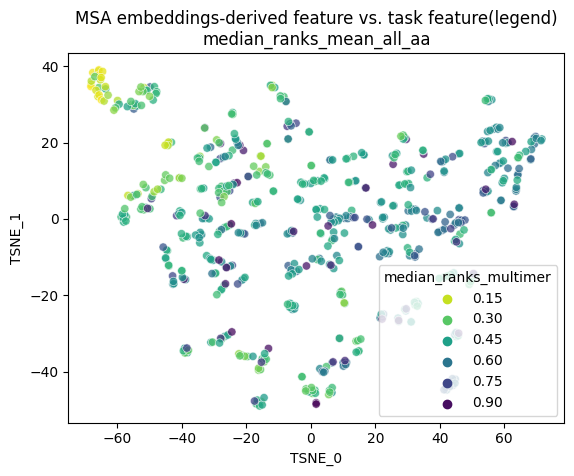

mean_ranks_mean_all_aa 0


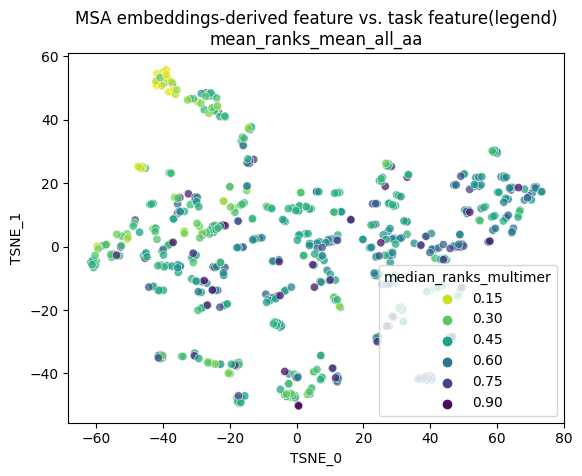

std_ranks_mean_all_aa 0


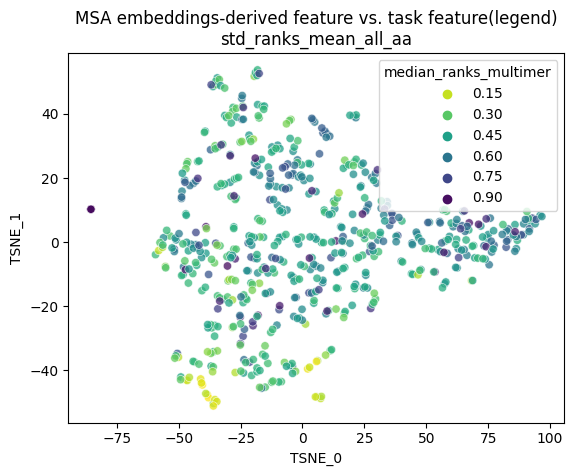

rank_1_mean_pep 0


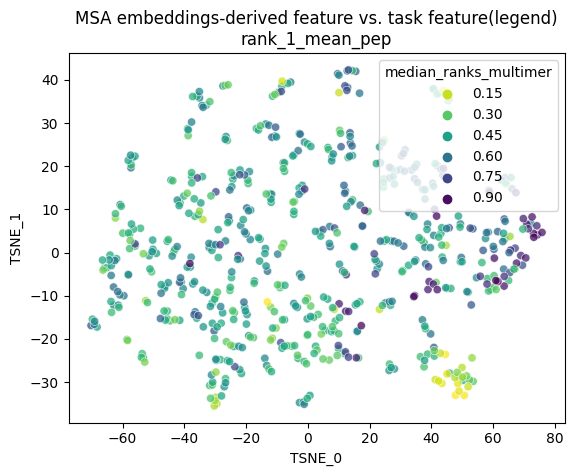

median_ranks_mean_pep 0


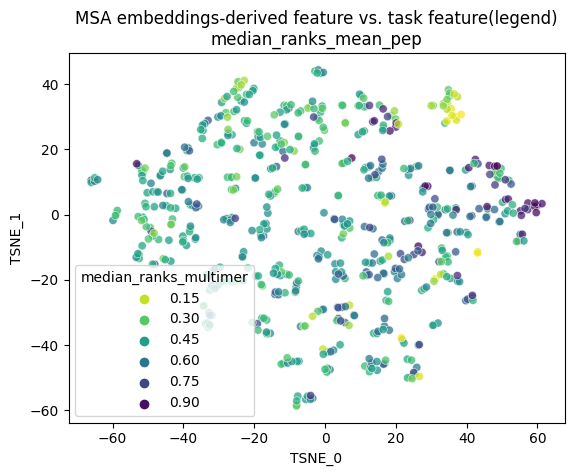

mean_ranks_mean_pep 0


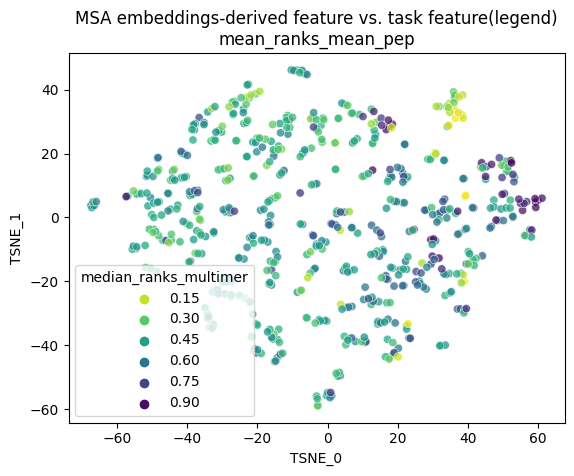

std_ranks_mean_pep 0


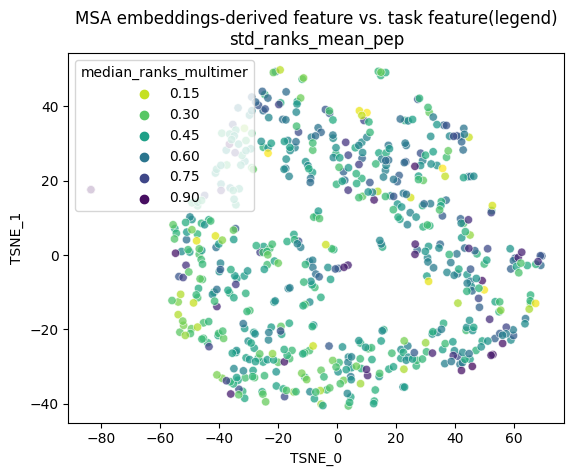

rank_1_mean_prot 0


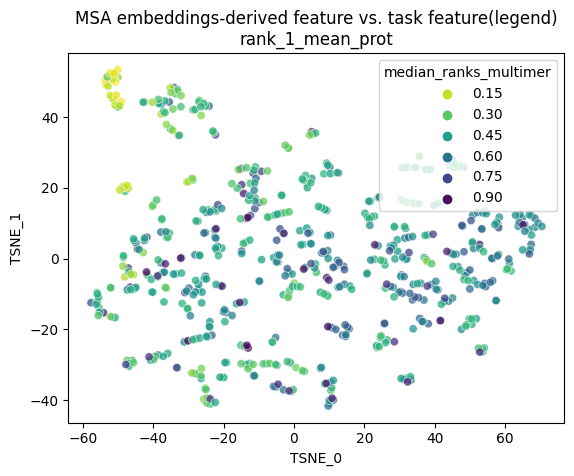

median_ranks_mean_prot 0


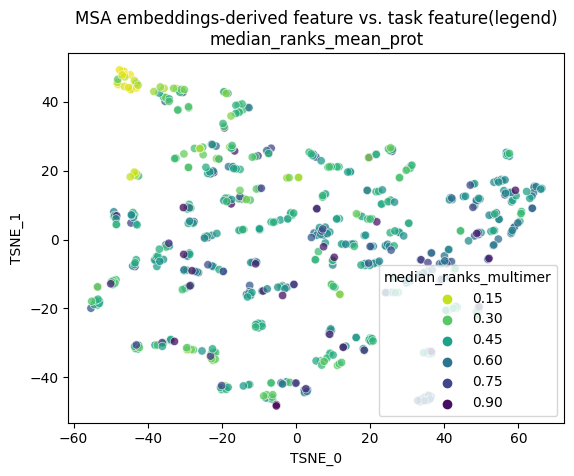

mean_ranks_mean_prot 0


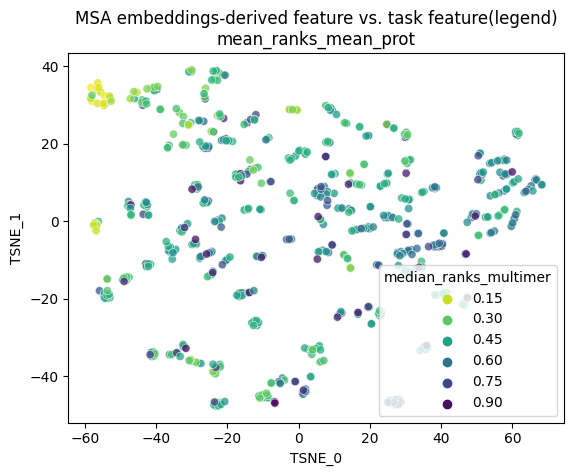

std_ranks_mean_prot 0


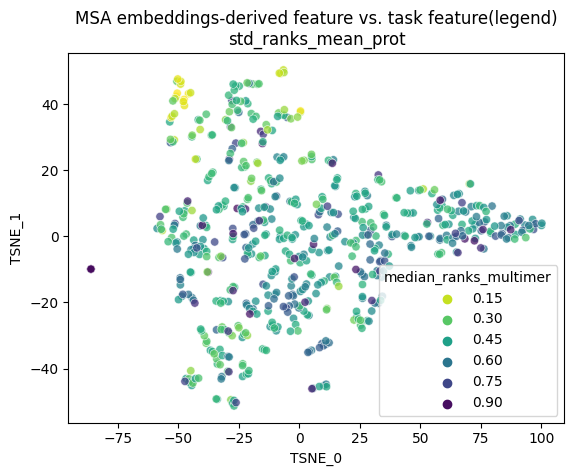

rank_1_std_all_aa 0


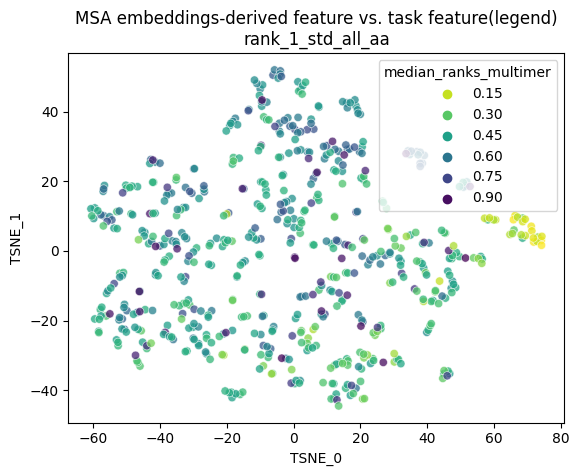

median_ranks_std_all_aa 0


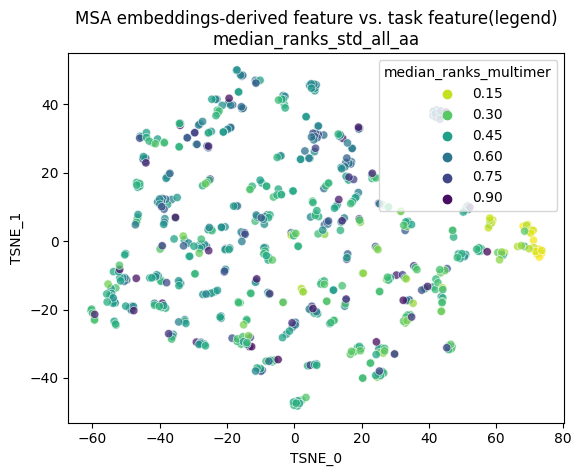

mean_ranks_std_all_aa 0


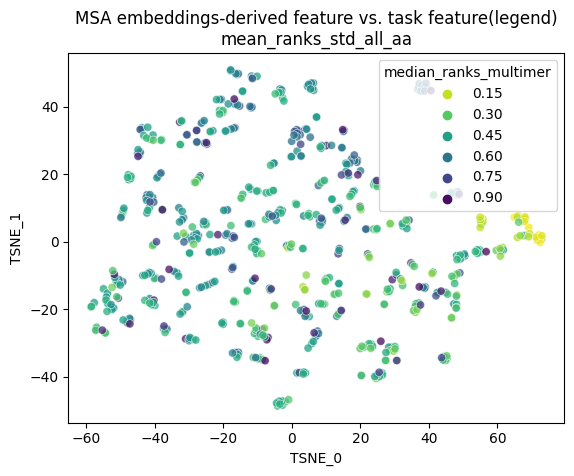

std_ranks_std_all_aa 0


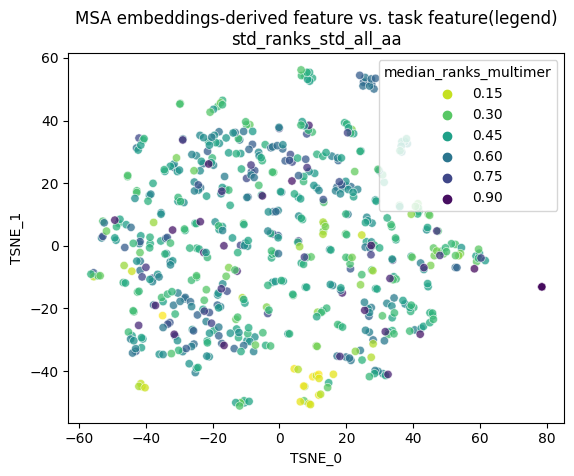

rank_1_std_pep 0


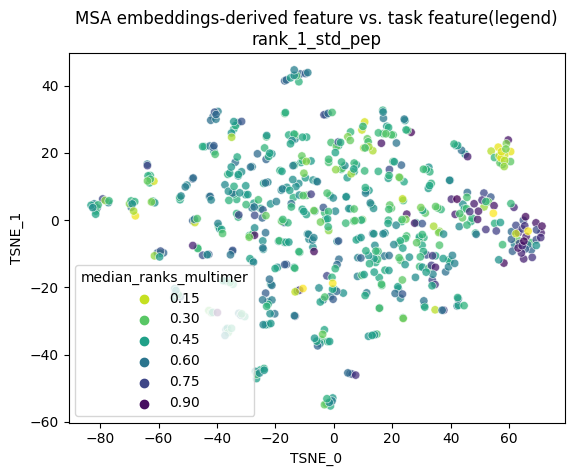

median_ranks_std_pep 0


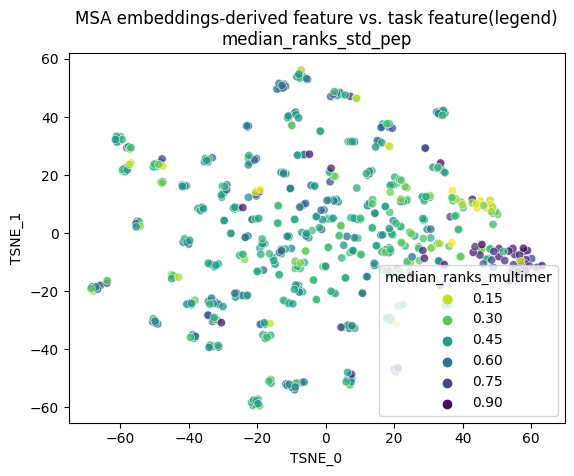

mean_ranks_std_pep 0


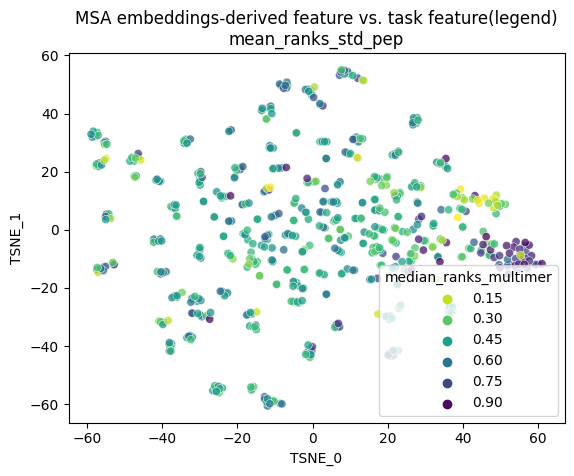

std_ranks_std_pep 0


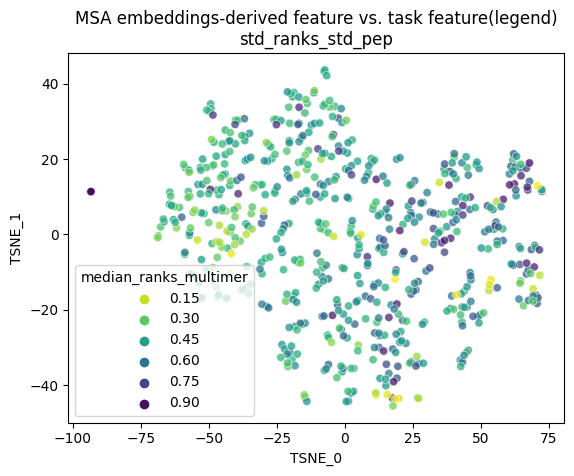

rank_1_std_prot 0


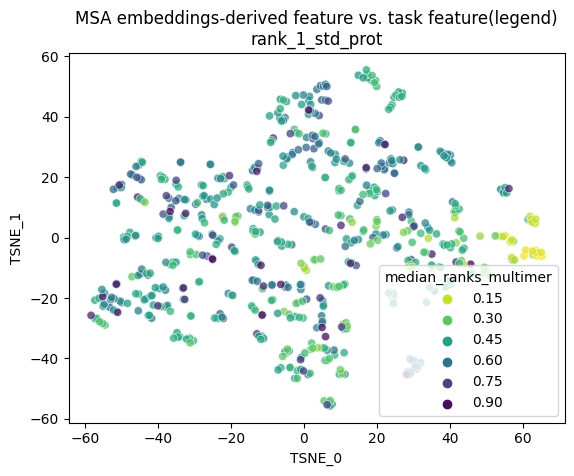

median_ranks_std_prot 0


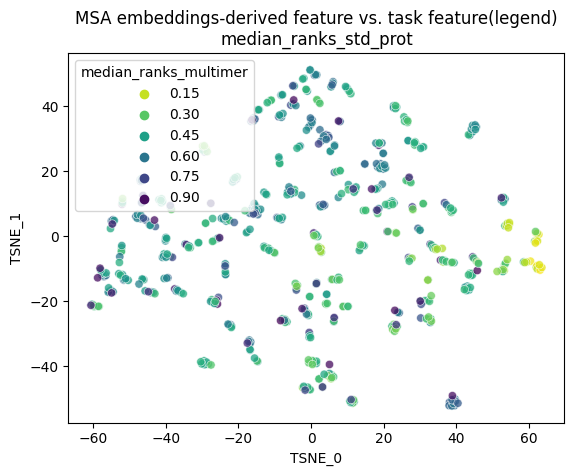

mean_ranks_std_prot 0


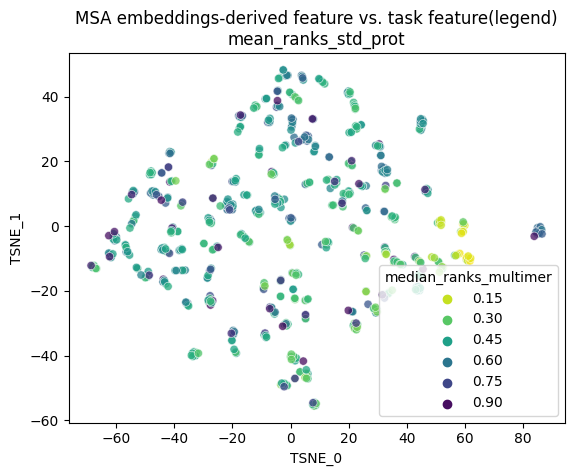

std_ranks_std_prot 0


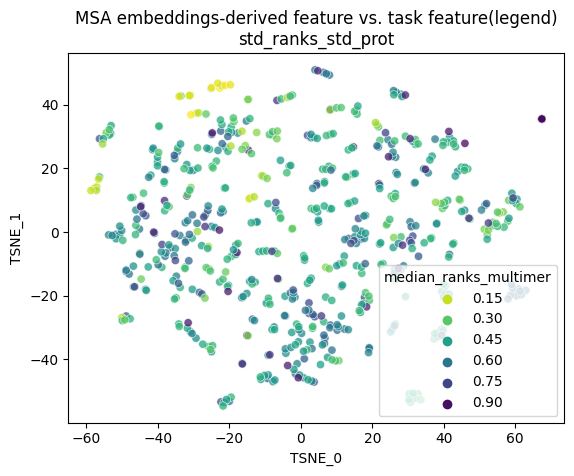

rank_1_min_all_aa 0


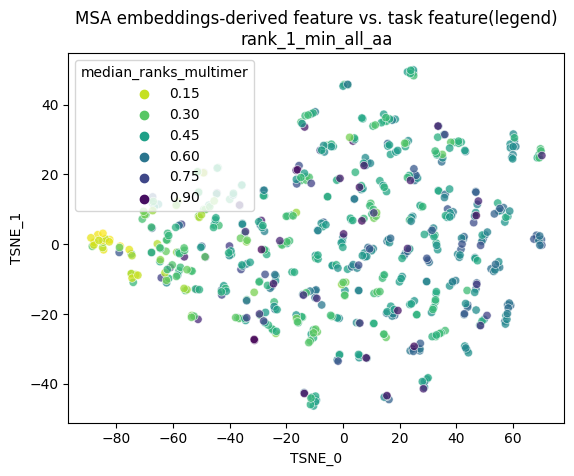

median_ranks_min_all_aa 0


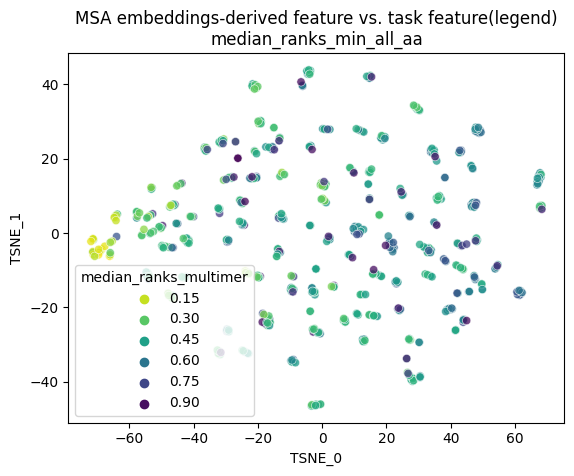

mean_ranks_min_all_aa 0


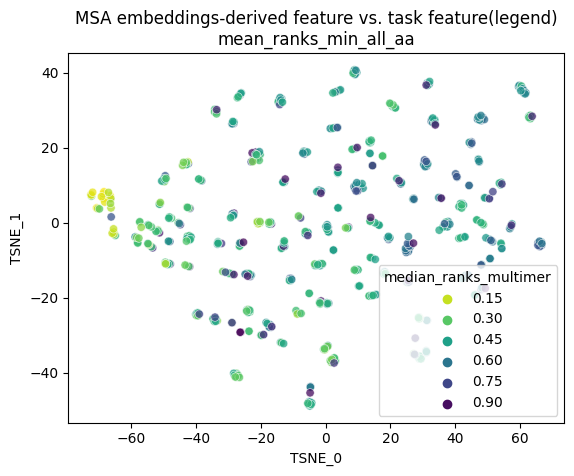

std_ranks_min_all_aa 0


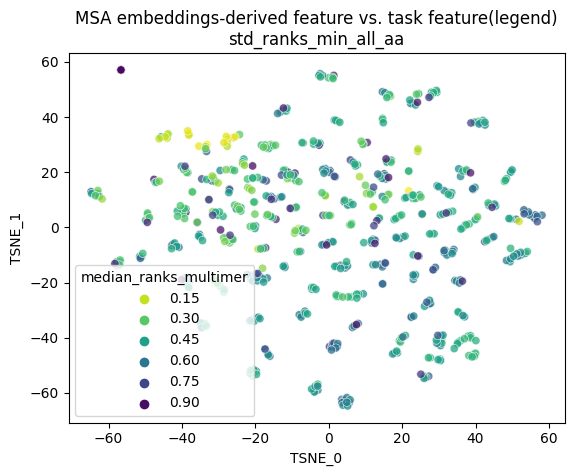

rank_1_min_pep 0


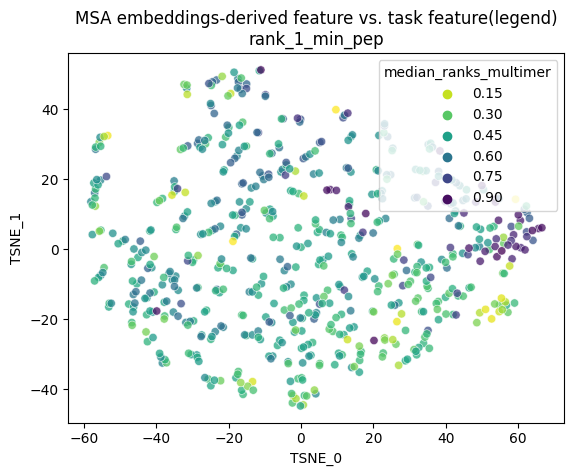

median_ranks_min_pep 0


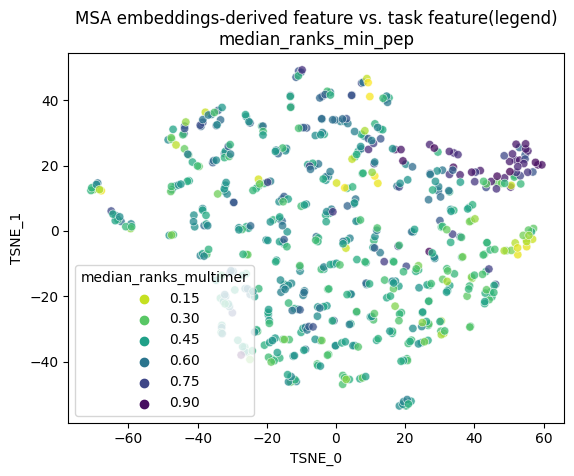

mean_ranks_min_pep 0


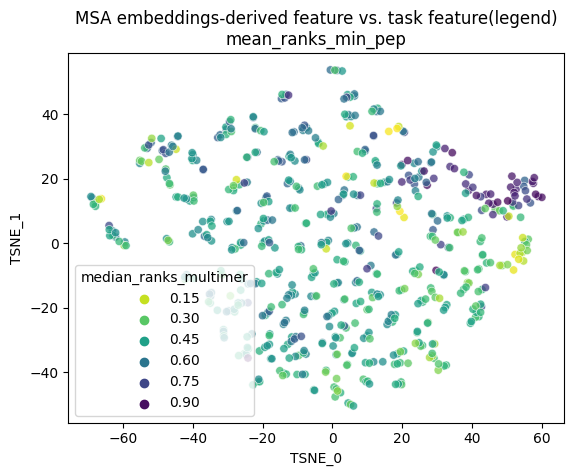

std_ranks_min_pep 0


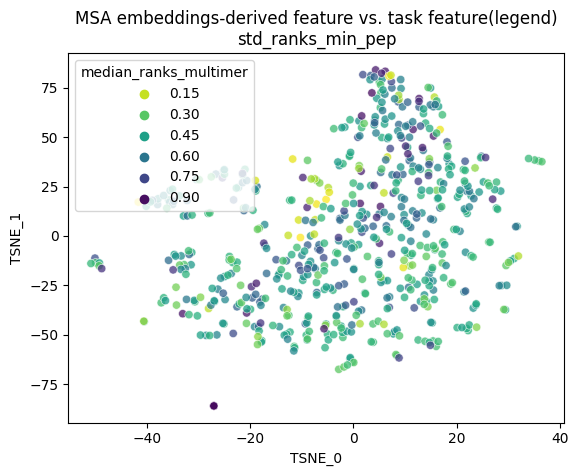

rank_1_min_prot 0


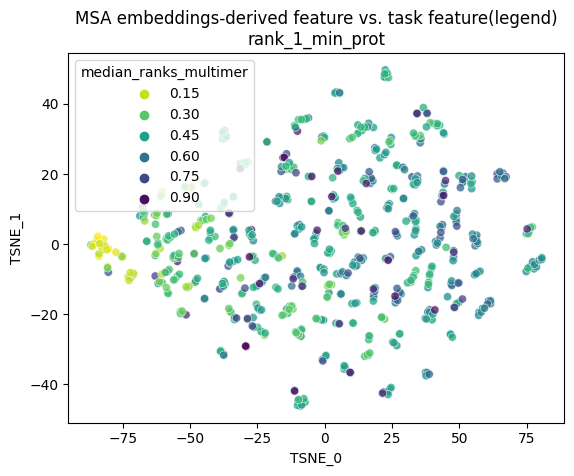

median_ranks_min_prot 0


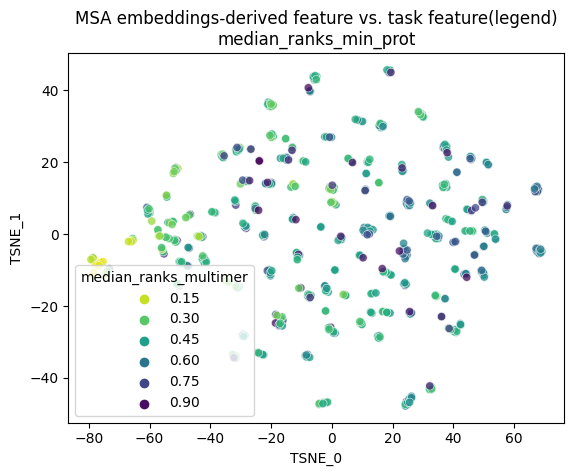

mean_ranks_min_prot 0


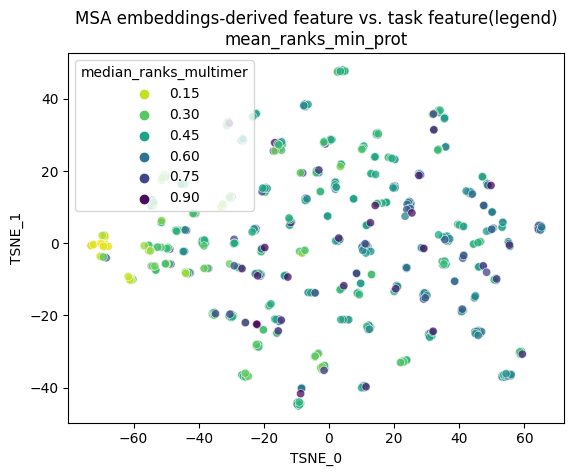

std_ranks_min_prot 0


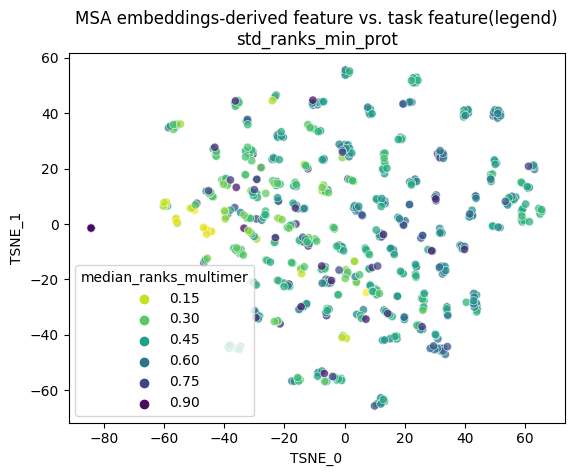

rank_1_max_all_aa 0


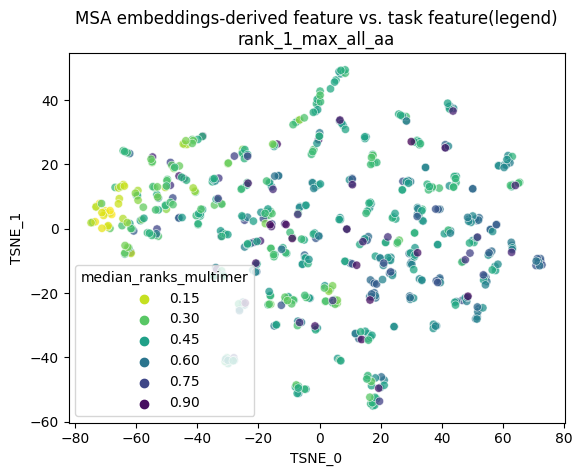

median_ranks_max_all_aa 0


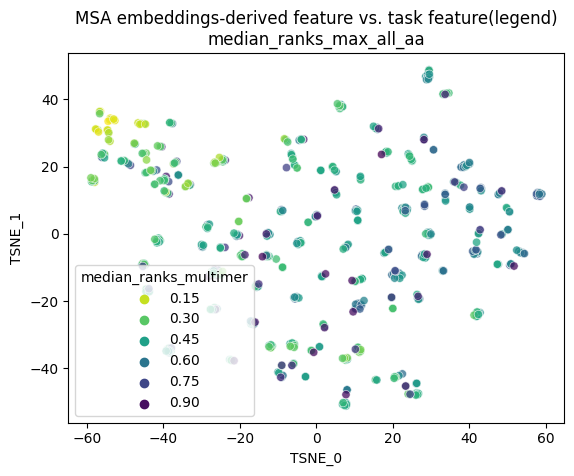

mean_ranks_max_all_aa 0


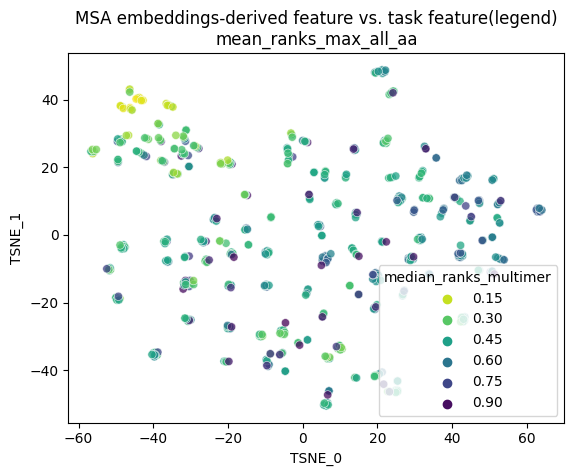

std_ranks_max_all_aa 0


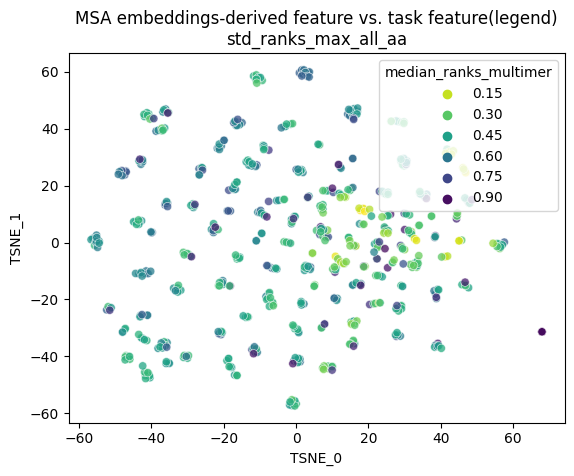

rank_1_max_pep 0


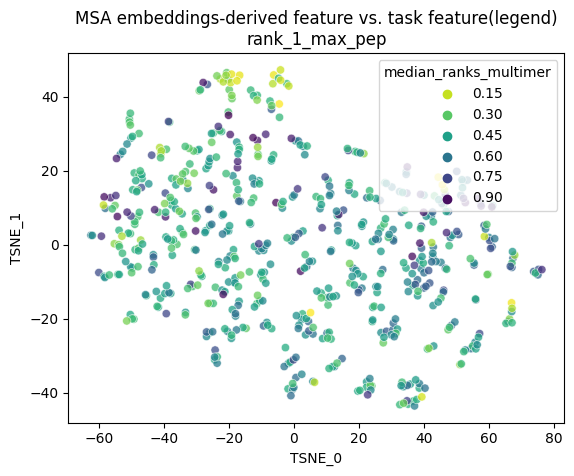

median_ranks_max_pep 0


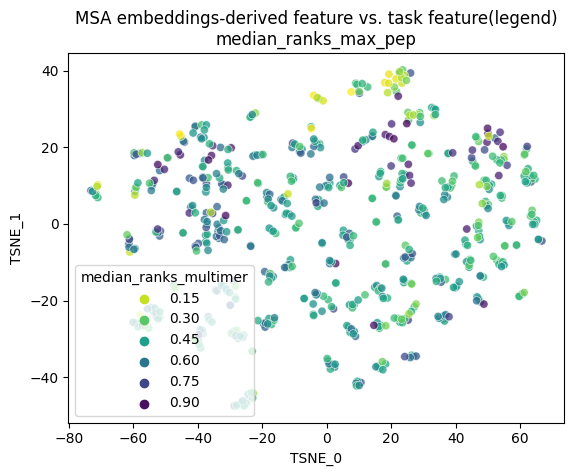

mean_ranks_max_pep 0


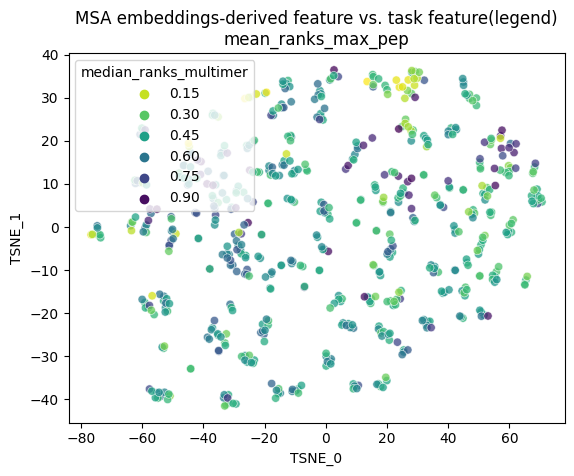

std_ranks_max_pep 0


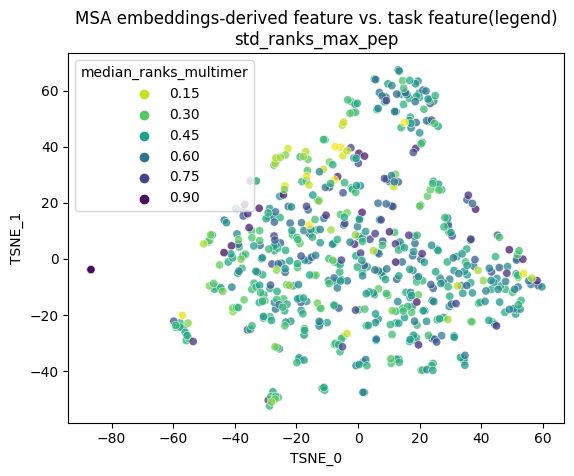

rank_1_max_prot 0


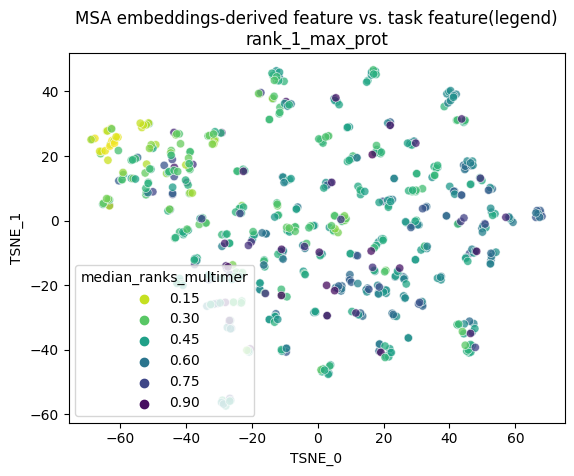

median_ranks_max_prot 0


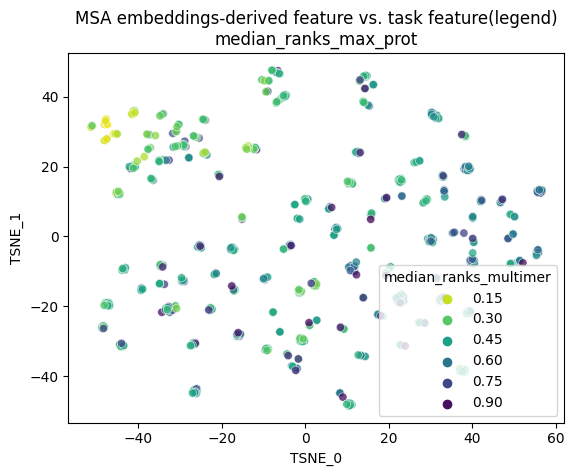

mean_ranks_max_prot 0


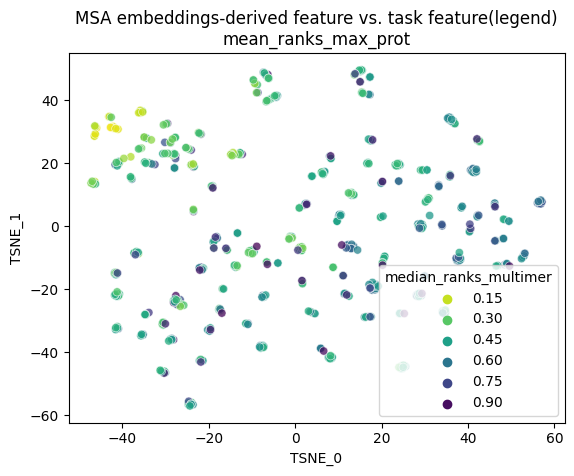

std_ranks_max_prot 0


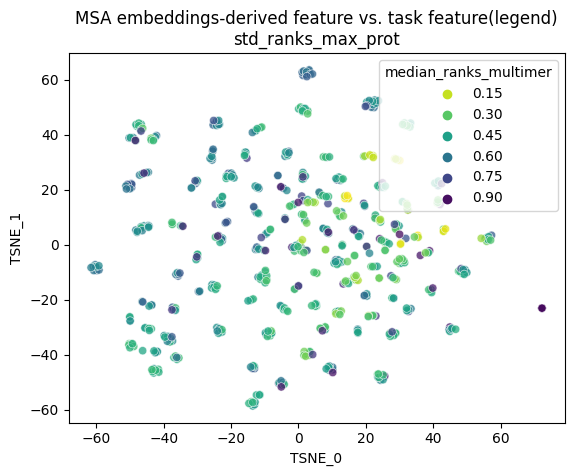

In [ ]:
run_msa_features_against_solo_feature(feature_list, complex_list, solo_feature_name = "median_ranks_multimer",
                                      df=df, msa_embeds=msa_embeds)

rank_1_mean_all_aa 0


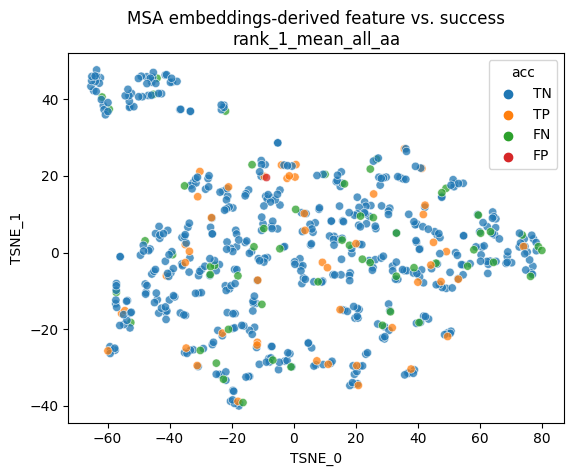

median_ranks_mean_all_aa 0


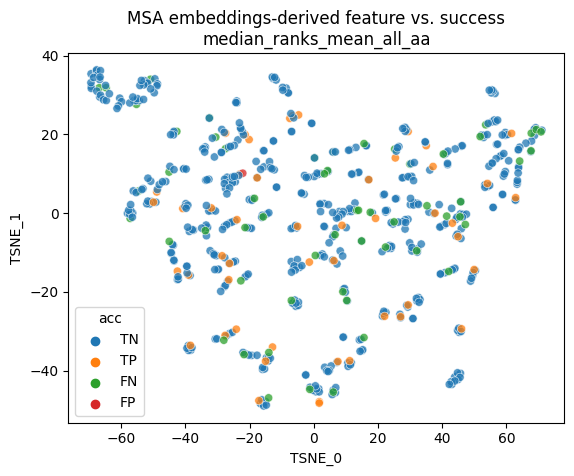

mean_ranks_mean_all_aa 0


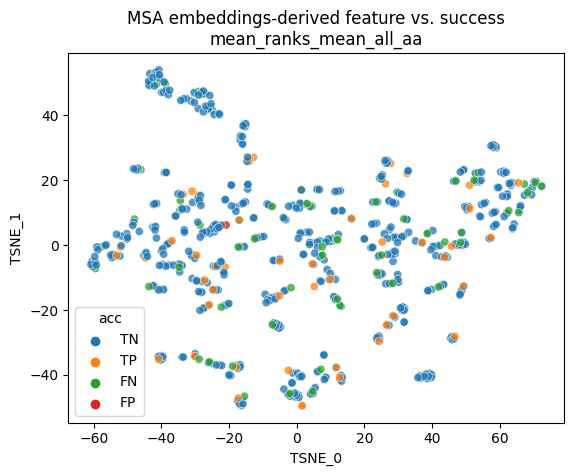

std_ranks_mean_all_aa 0


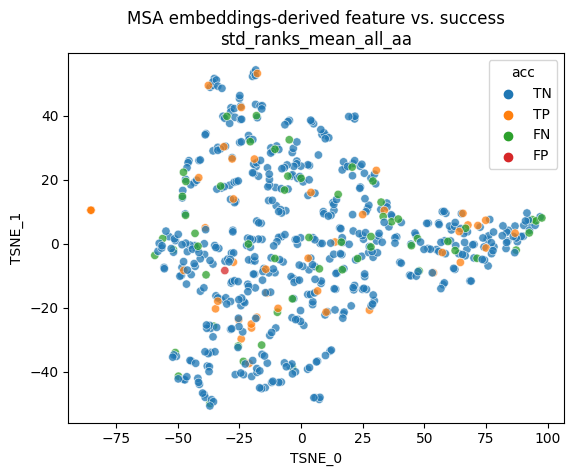

rank_1_mean_pep 0


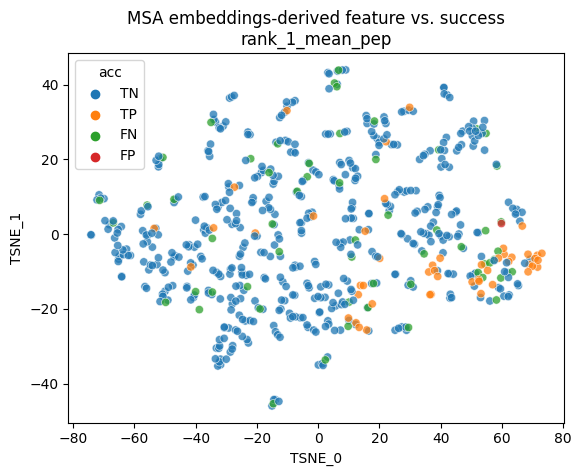

median_ranks_mean_pep 0


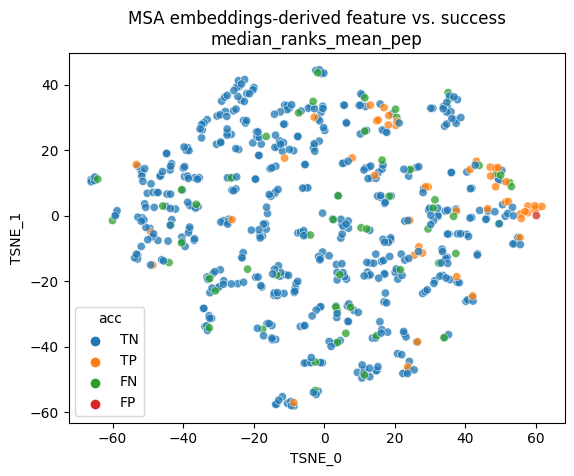

mean_ranks_mean_pep 0


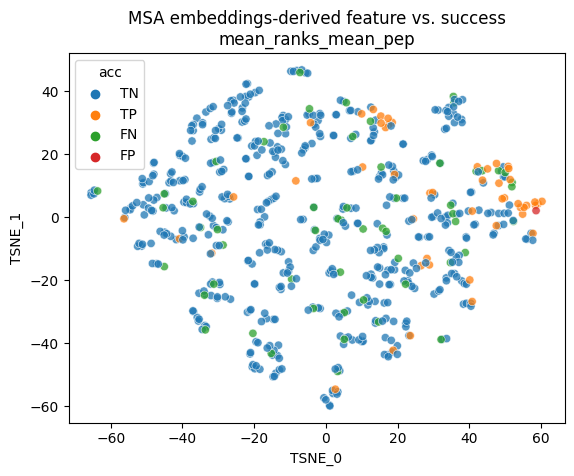

std_ranks_mean_pep 0


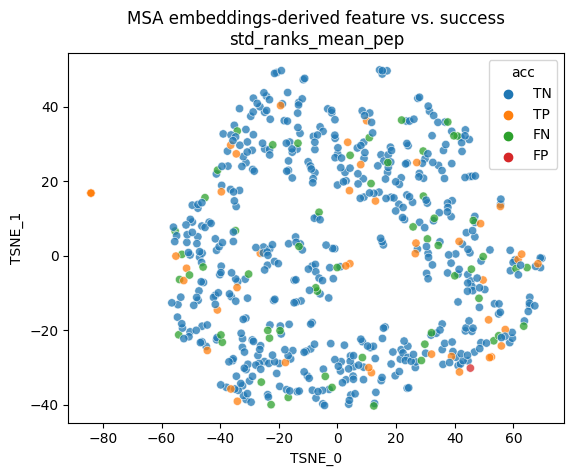

rank_1_mean_prot 0


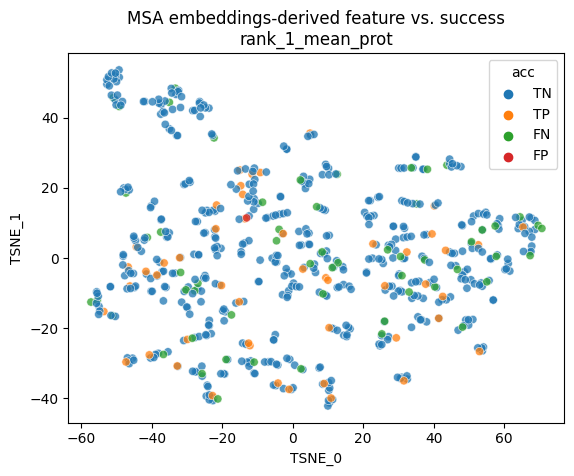

median_ranks_mean_prot 0


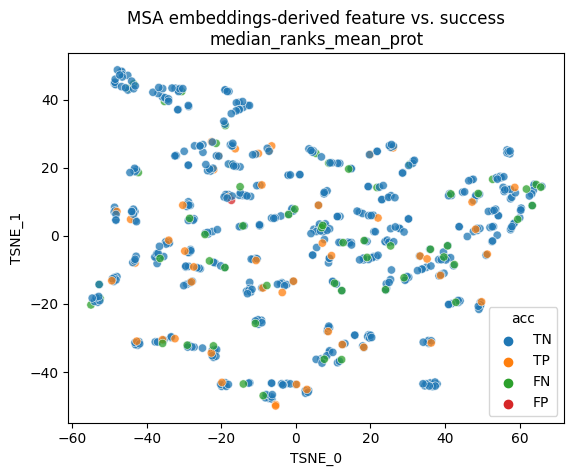

mean_ranks_mean_prot 0


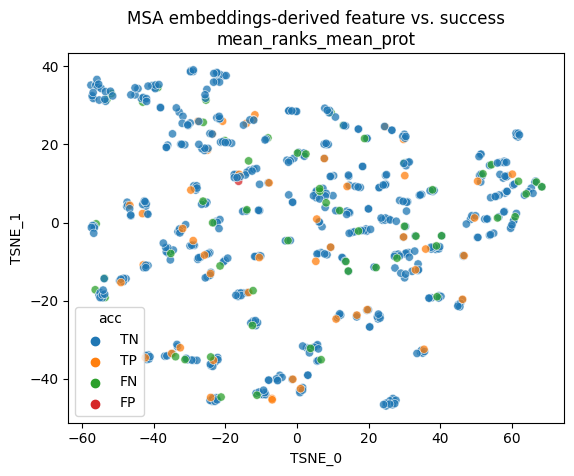

std_ranks_mean_prot 0


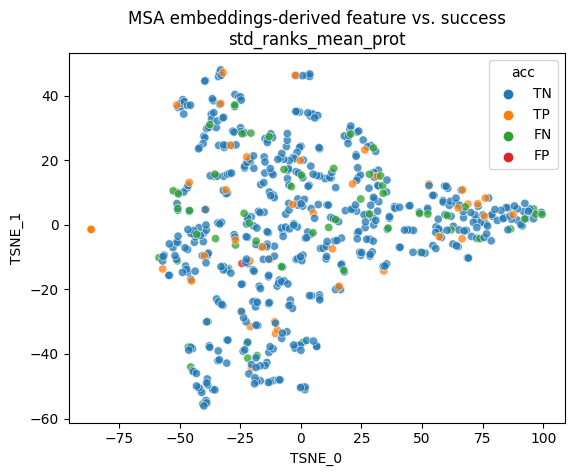

rank_1_std_all_aa 0


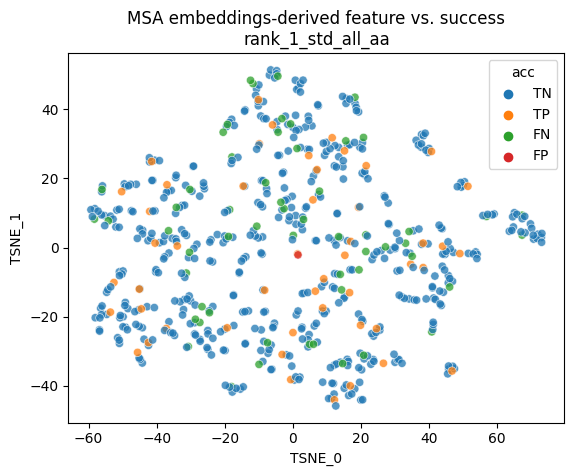

median_ranks_std_all_aa 0


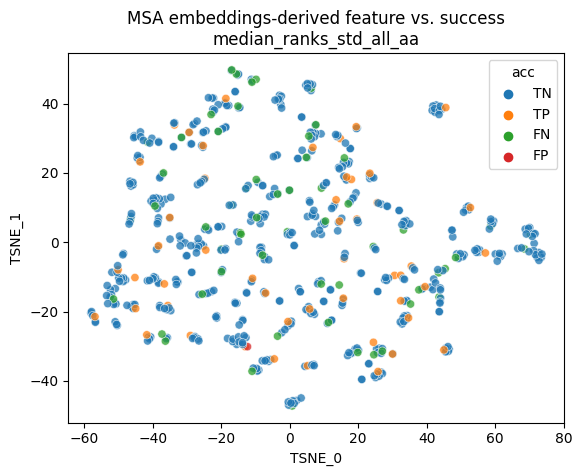

mean_ranks_std_all_aa 0


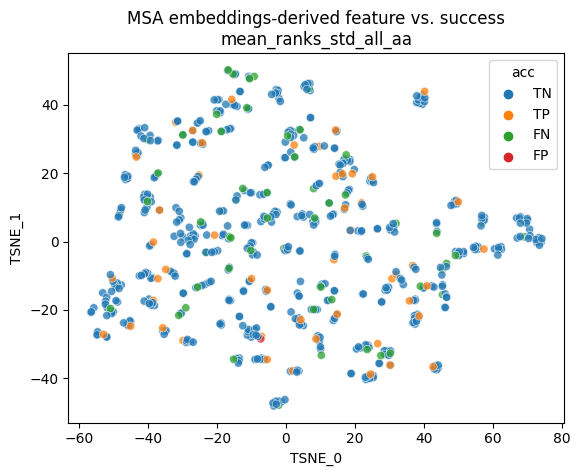

std_ranks_std_all_aa 0


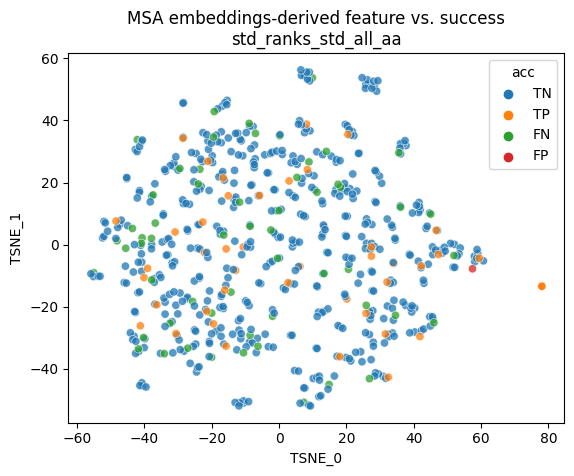

rank_1_std_pep 0


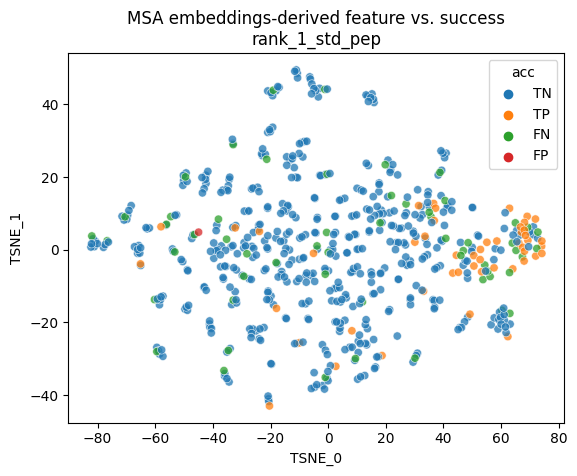

median_ranks_std_pep 0


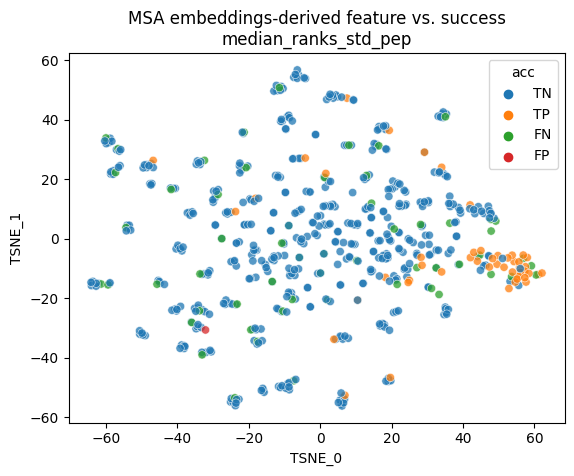

mean_ranks_std_pep 0


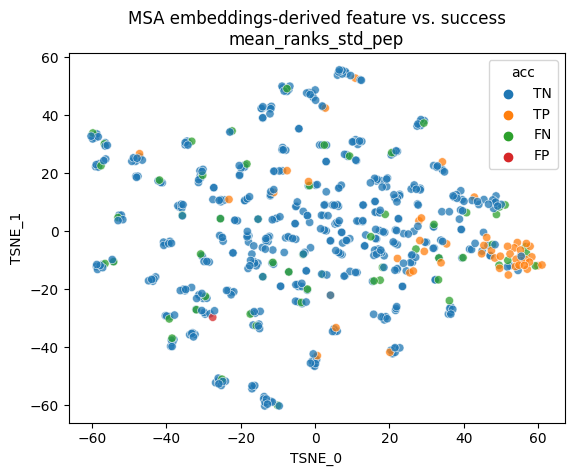

std_ranks_std_pep 0


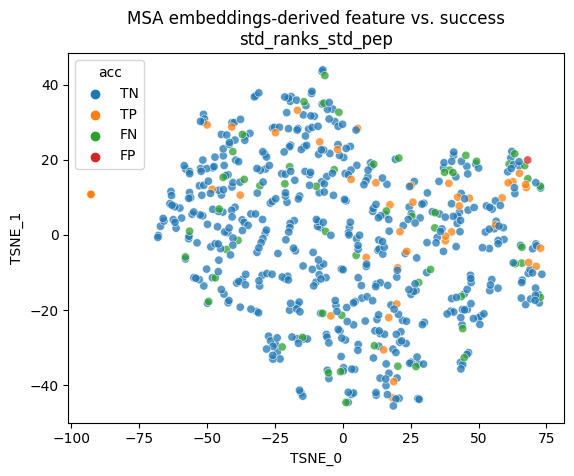

rank_1_std_prot 0


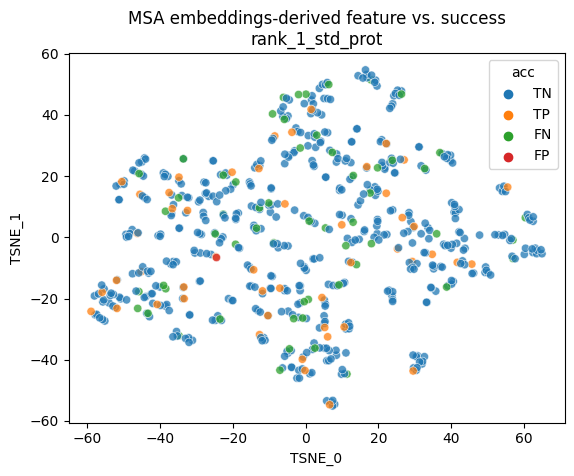

median_ranks_std_prot 0


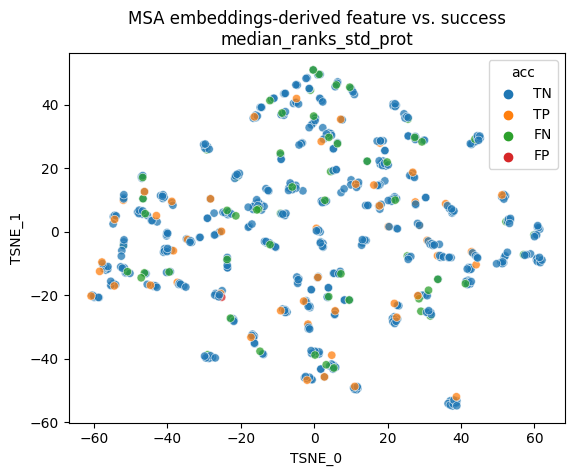

mean_ranks_std_prot 0


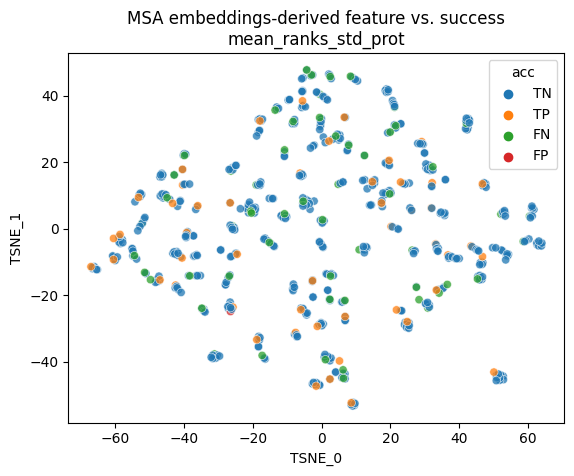

std_ranks_std_prot 0


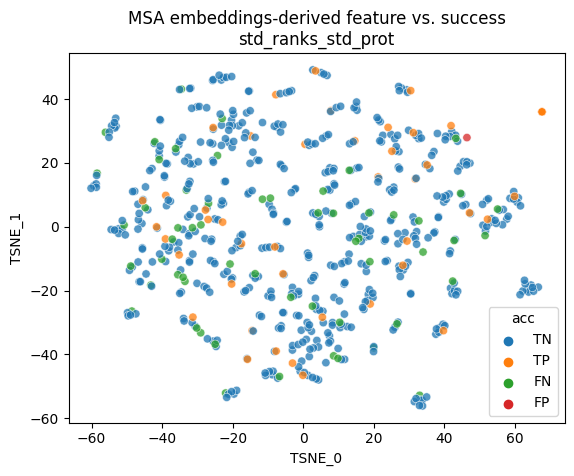

rank_1_min_all_aa 0


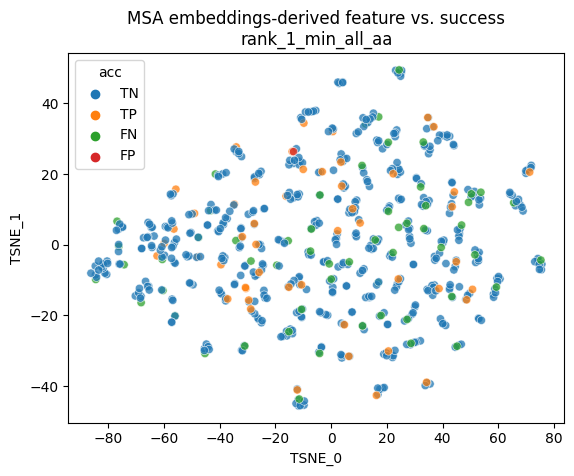

median_ranks_min_all_aa 0


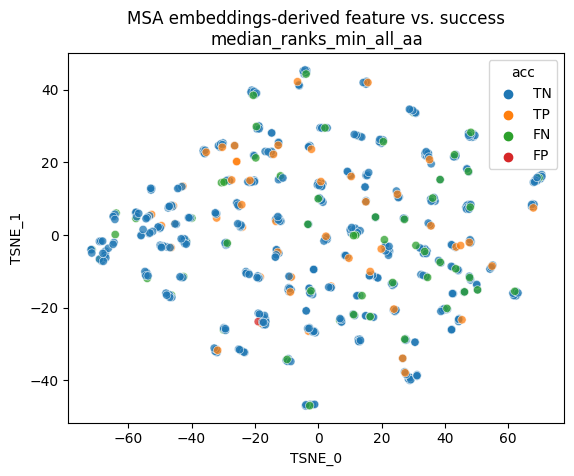

mean_ranks_min_all_aa 0


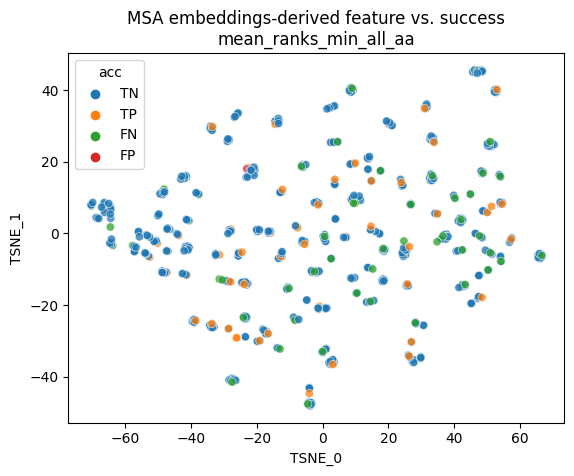

std_ranks_min_all_aa 0


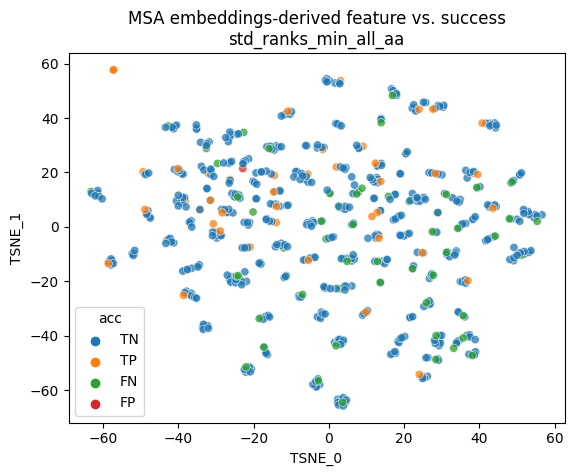

rank_1_min_pep 0


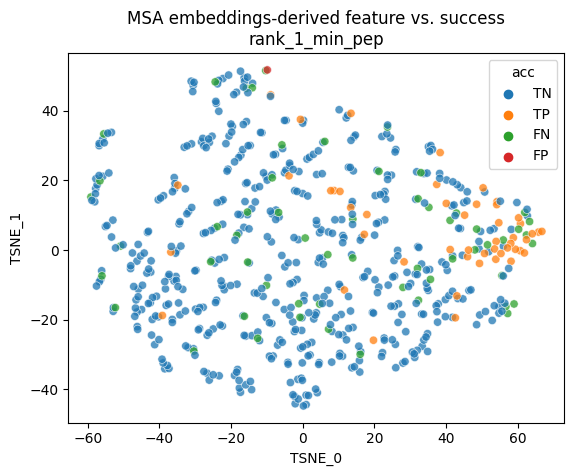

median_ranks_min_pep 0


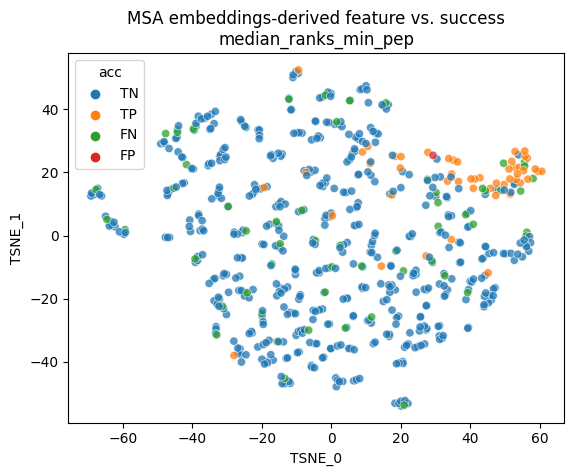

mean_ranks_min_pep 0


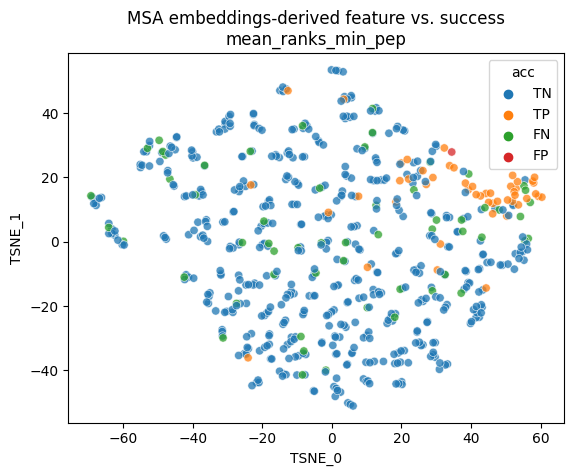

std_ranks_min_pep 0


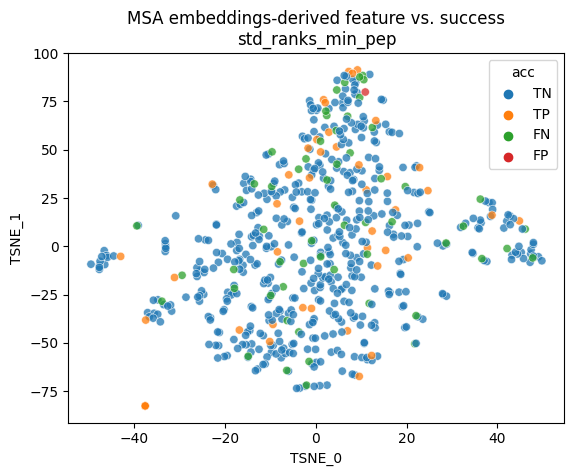

rank_1_min_prot 0


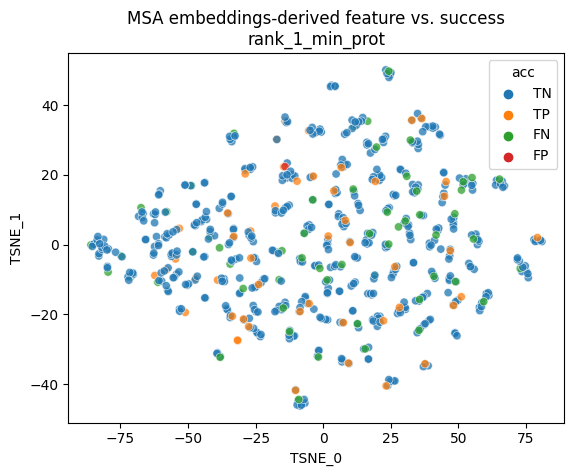

median_ranks_min_prot 0


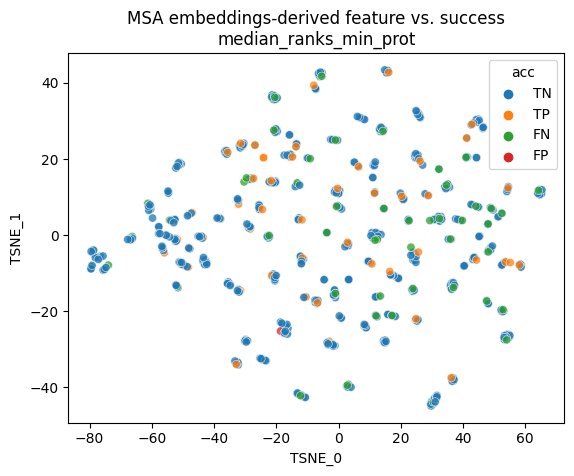

mean_ranks_min_prot 0


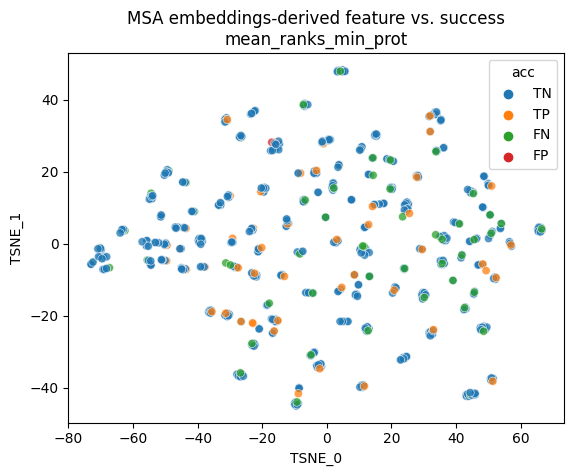

std_ranks_min_prot 0


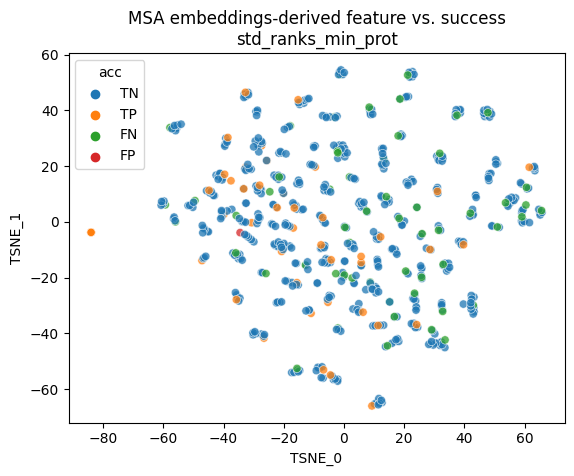

rank_1_max_all_aa 0


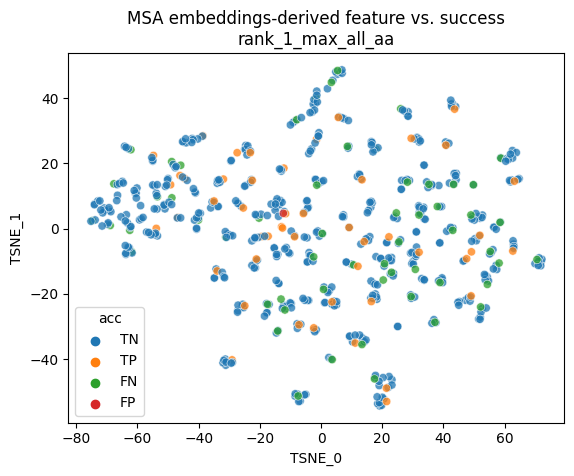

median_ranks_max_all_aa 0


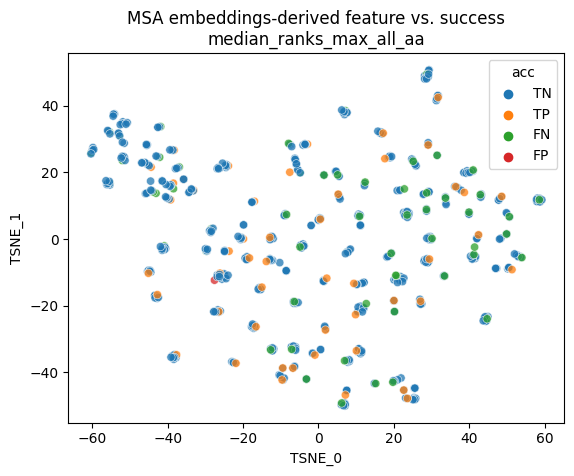

mean_ranks_max_all_aa 0


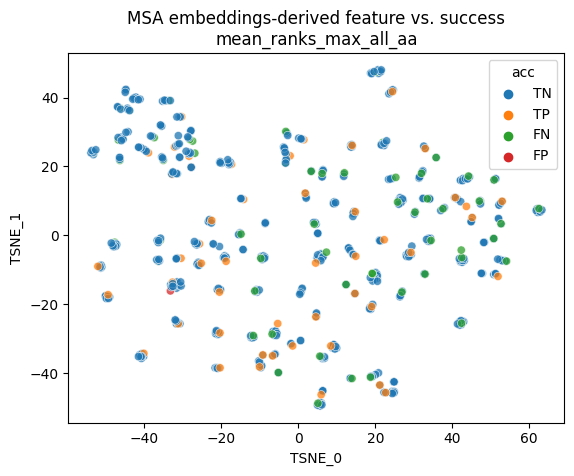

std_ranks_max_all_aa 0


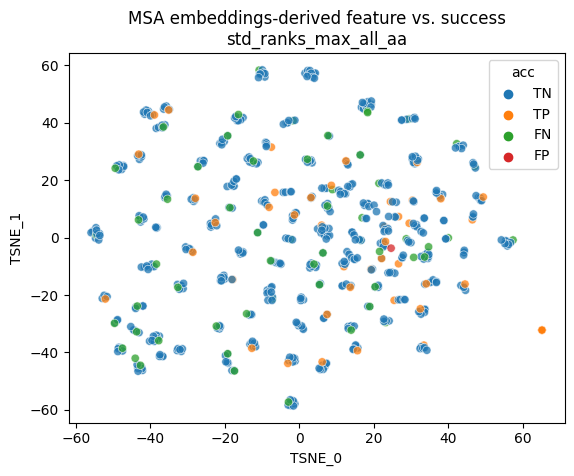

rank_1_max_pep 0


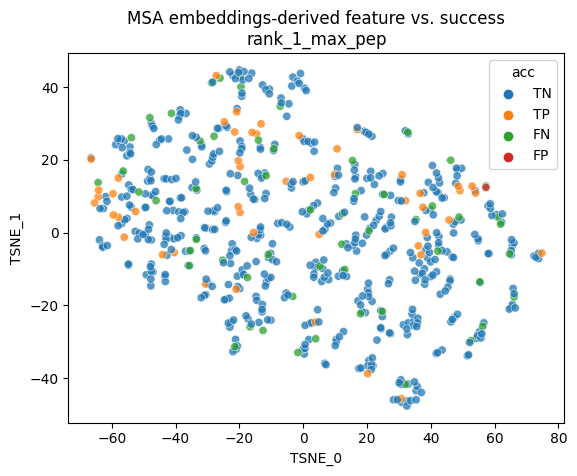

median_ranks_max_pep 0


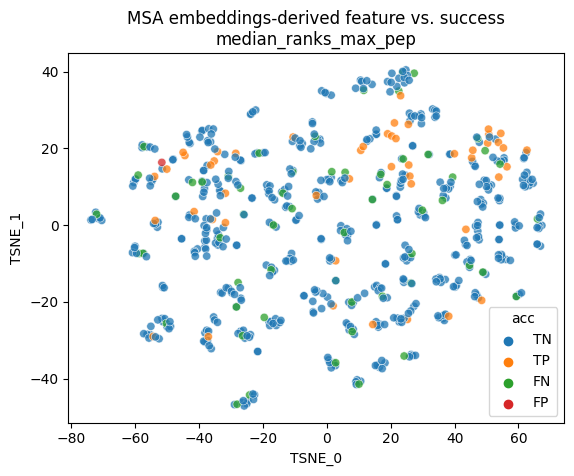

mean_ranks_max_pep 0


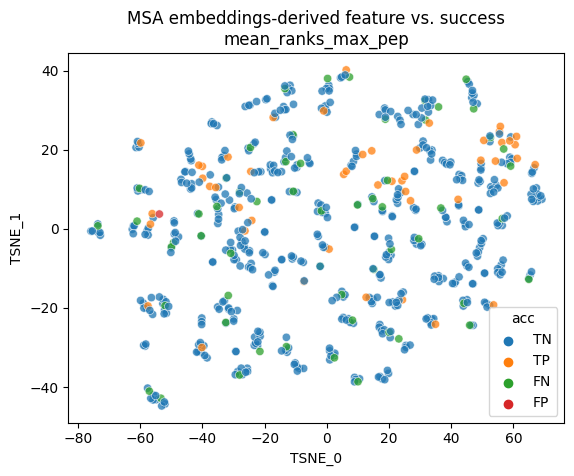

std_ranks_max_pep 0


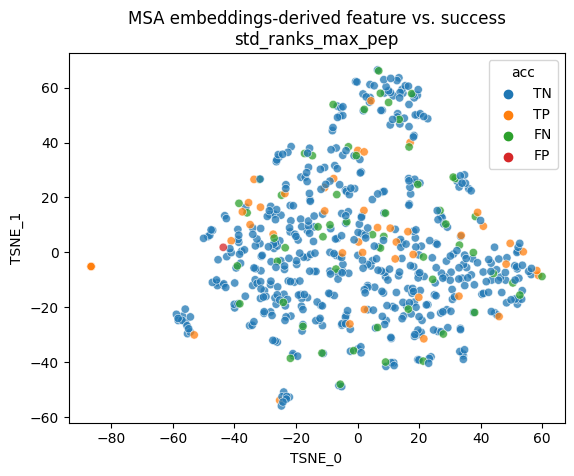

rank_1_max_prot 0


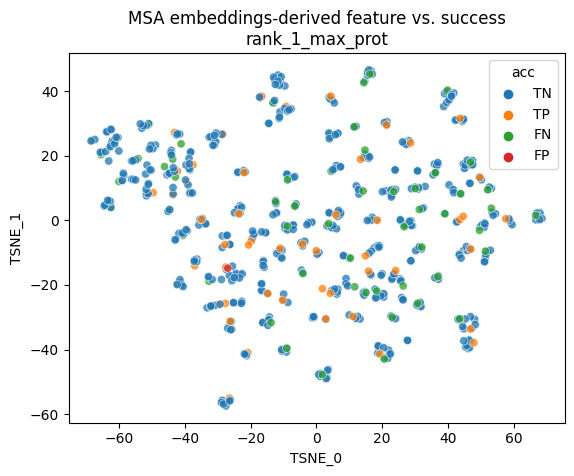

median_ranks_max_prot 0


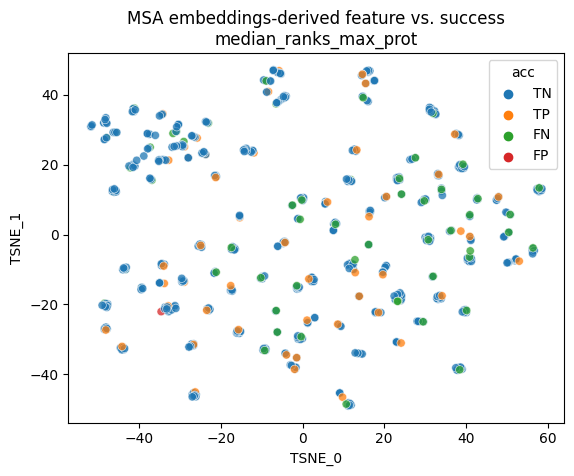

mean_ranks_max_prot 0


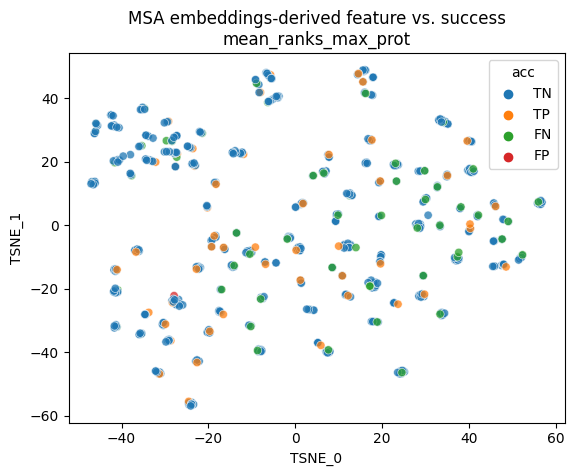

std_ranks_max_prot 0


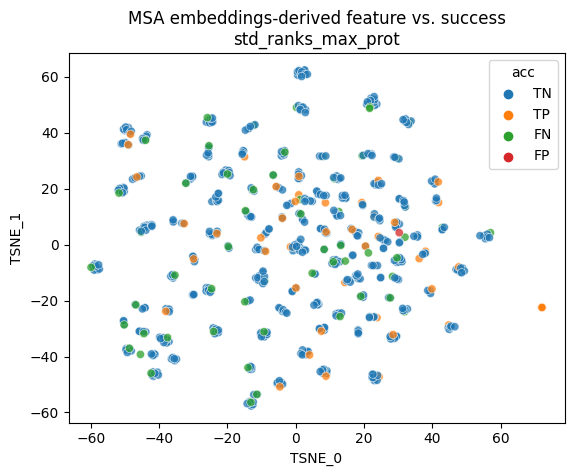

In [ ]:
run_msa_features_against_success_rate(feature_list, complex_list, solo_feature_name = "median_ranks_multimer",
                                      df=df, msa_embeds=msa_embeds)

# Sandbox

In [ ]:
df

,complex_id,rank_1_max_pae,median_ranks_max_pae,mean_ranks_max_pae,std_ranks_max_pae,rank_1_ptm,median_ranks_ptm,mean_ranks_ptm,std_ranks_ptm,rank_1_iptm,...,std_ranks_median_21_prob,rank_1_mean_21_prob,median_ranks_mean_21_prob,mean_ranks_mean_21_prob,std_ranks_mean_21_prob,rank_1_std_21_prob,median_ranks_std_21_prob,mean_ranks_std_21_prob,std_ranks_std_21_prob,is_positive
0,6iur_C-6iqj_A,30.515625,30.531250,30.453125,0.225220,0.729980,0.700195,0.706055,0.010201,0.250000,...,0.000827,0.006649,0.007099,0.007271,0.000874,0.036285,0.019836,0.021591,0.007191,0
1,6kmj_C-6i42_A,29.968750,29.921875,29.921875,0.340820,0.910156,0.895020,0.896973,0.007809,0.600098,...,0.000259,0.024399,0.027634,0.027252,0.002111,0.117493,0.100525,0.100098,0.012970,0
2,6qbb_P-6jfa_A,30.125000,29.875000,29.859375,0.405518,0.870117,0.870117,0.868164,0.004002,0.429932,...,0.000443,0.043671,0.040955,0.040405,0.003183,0.102661,0.091919,0.088684,0.009789,0
3,6l7c_S-6i7q_V,31.546875,31.281250,31.250000,0.183105,0.799805,0.799805,0.770996,0.061401,0.609863,...,0.000958,0.017960,0.026001,0.024200,0.003521,0.095032,0.067688,0.070435,0.011841,0
4,6jnf_D-6ifc_A,31.046875,31.171875,31.125000,0.164551,0.700195,0.689941,0.687988,0.016617,0.280029,...,0.000525,0.019608,0.017105,0.017487,0.001731,0.052338,0.046844,0.047089,0.003508,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
617,5qtu_H-6o5o_A,30.281250,31.187500,31.093750,0.322266,0.819824,0.765137,0.778809,0.034485,0.370117,...,0.002384,0.030304,0.027252,0.026489,0.003098,0.075134,0.060028,0.061401,0.006359,0
618,6a0h_C-6spb_F,30.468750,30.515625,30.531250,0.117859,0.799805,0.799805,0.794922,0.014999,0.229980,...,0.001781,0.033813,0.029465,0.029404,0.004051,0.056244,0.047577,0.048004,0.007652,0
619,6pbv_G-6i42_A,28.453125,28.968750,29.062500,0.457031,0.910156,0.890137,0.894043,0.006634,0.569824,...,0.000256,0.030212,0.032227,0.032349,0.001867,0.116699,0.080872,0.088806,0.016006,0
620,6qns_S-6i7q_V,31.281250,31.296875,31.281250,0.102661,0.799805,0.779785,0.758789,0.053741,0.330078,...,0.001769,0.012375,0.012794,0.013344,0.001536,0.049072,0.045715,0.045868,0.003990,0


In [ ]:
# one key per complex
complex_list = list(msa_embeds.keys())

# one key per vector feature
feature_list = list(msa_embeds['6iur_C-6iqj_A'].keys())

# each feature is (256,) shaped
for key in msa_embeds['6iur_C-6iqj_A'].keys():
  print(key)
  print(msa_embeds['6iur_C-6iqj_A'][key])
#msa_embeds['6iur_C-6iqj_A']['rank_1_mean_all_aa'].shape

rank_1_mean_all_aa
[-2.9834e-01  8.6953e+00 -5.9805e+00 -4.6826e-01 -3.0875e+01  3.8599e-01
  1.9688e+00 -1.0938e+00 -4.1626e-01 -2.7734e+00  3.7461e+00  8.6914e-01
  9.5801e-01  1.8721e+00 -3.6987e-01 -3.0957e+00  7.6855e-01  5.6104e-01
  1.8818e+00  2.0352e+00 -5.5511e-02 -6.9727e+00 -9.6631e-01  2.8574e+00
 -2.9761e-01  2.7124e-01  4.5664e+00 -7.5732e-01 -4.0078e+00 -1.9287e+00
  3.0054e-01  1.3809e+00 -3.0273e+00 -7.3389e-01  3.8984e+00 -6.0156e-01
  3.1699e+00 -2.4570e+00 -2.8105e+00 -2.8867e+00 -3.8789e+00 -6.3672e-01
  1.6611e+00 -1.0830e+00  1.6035e+00 -3.3379e+00  3.8984e+00 -3.0786e-01
  4.8516e+00  1.9375e+00  4.0117e+00  4.3213e-02 -4.6211e+00 -2.1445e+00
 -2.6035e+00  1.4102e+00 -4.3164e+00 -1.1309e+00 -8.4922e+00 -1.5149e-01
  1.4990e+00  3.6660e+00 -4.7656e-01 -3.2773e+00 -4.2305e+00 -1.6221e+00
 -1.4050e-01  8.8330e-01  6.2439e-02 -9.4336e-01 -1.5947e+00 -4.2725e+02
 -7.4316e-01 -3.8652e+00  1.5742e+00 -2.9121e+00  6.4102e+00  1.0518e+00
  1.6787e+00 -4.8242e+00  1.4414

In [ ]:
feature_name = feature_list[0]

feat_value_list = []
label_list = []

for complex_name in complex_list:
  label_list.append(df[df['complex_id'] == complex_name]['is_positive'].values[0])
  feat_value_list.append(msa_embeds[complex_name][feature_name])

In [ ]:
np.std(np.array([5000, 6000]))

500.0

In [ ]:
np.std(np.array([5000, 6000], dtype = np.float16))

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:235: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


inf

In [ ]:
np.nanstd(np.array([5000, 6000], dtype = np.float16))

/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1746: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


inf

In [ ]:
np.std(np.array([5000, 6000], dtype = np.float16), dtype = np.float64)

500.0

In [ ]:
np.nanstd(np.array([5000, 6000], dtype = np.float16), dtype = np.float64)

inf

In [ ]:
np.nanstd(np.array([5000, 6000, np.inf]))

/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1741: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe', where=where)


nan

In [ ]:
test = np.array([5000, 6000, np.nan, np.inf])

test = np.nan_to_num(test.astype(np.float64))
# inf becomes max/min possible value of dtype, but that just means it will explode in any operation on it
np.std(test)

inf

In [ ]:
np.finfo(np.float16)

finfo(resolution=0.001, min=-6.55040e+04, max=6.55040e+04, dtype=float16)